<a href="https://colab.research.google.com/github/le0x99/BrainImaging/blob/main/Copy_of_FINAL_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project Notebook Introduction

Welcome to the main project notebook! 

## What is the goal of this notebook?

This notebook should contain your project write-up and the analyses conducted on the provided data. For each project, the notebook provides links to a few articles on the subject of the notebook, and a few examples of analyses that you could/should do. But it is not at all exhaustive: If you need to install more python packages or other software, do so. If you want to search for additional literature to support your writing, do so!

Your goal is to work from these examples towards answering the list of questions specific to each of the projects, and write a coherent report following the structure at the bottom of this notebook. Your colleagues (and I) will read and grade the result. So, make sure that you provide ample and adequate descriptions of your results and methodologies. This notebook is likely going to get rather large as you add analyses, so best to use markdown cells and headings to create a table of contents structure, as you can see in the ToC menu on the left of the Colab user interface.  

If this project feels a bit open-ended, that's because it is - just like actual research! ***But you are not alone!*** You will collaborate with your fellow students in your group! I also want to push you towards asking any and all questions in the canvas discussions, and directly to me via email and the Friday Zoom meetings. I'm here to help, and will give hints if you ask me the right questions. 

You are free to make this as beautiful and far-reaching as you feel like. But keep track of time, you will need to finish this the week before the exam. Perfect is the enemy of good, beware. 


## Installation etc.

The first part of this notebook is shared across the different projects, as the notebook will download the data for all the projects in the same way. 

The first installation and setup cells may take a little while to run as they fetch and install all the required software. It's also likely there's going to be a LOT of outputs that are irrelevant. Feel free to delete the output of this cell after it runs to free up space. 

In [ ]:
# this cell installs some dependencies. 
# feel free to disregard the output this generates

!apt -qq install inkscape > /dev/null
!pip -qq install nibabel nilearn
!pip -qq install git+https://github.com/gallantlab/pycortex.git#egg=pycortex



E: Failed to fetch http://security.ubuntu.com/ubuntu/pool/main/l/lxml/python-lxml_4.2.1-1ubuntu0.3_amd64.deb  404  Not Found [IP: 91.189.88.152 80]
E: Unable to fetch some archives, maybe run apt-get update or try with --fix-missing?
     |████████████████████████████████| 3.1MB 4.1MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 1.6MB 4.8MB/s 
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.


In [ ]:
# after these basic installs, we can import our required packages. 

import numpy as np
import scipy as sp
import nibabel as nb
import nilearn as nl
from nilearn.surface import load_surf_data
import os, shutil, urllib.request

from matplotlib import rc
rc('animation', html='jshtml')

import matplotlib.pyplot as plt
%matplotlib inline 

/usr/local/lib/python3.7/dist-packages/nilearn/datasets/__init__.py:90: FutureWarning: Fetchers from the nilearn.datasets module will be updated in version 0.9 to return python strings instead of bytes and Pandas dataframes instead of Numpy arrays.
  "Numpy arrays.", FutureWarning)


### Download of data: surfaces for plotting and project data

Both the surface data we'll use for visualization and the project fMRI data are on figshare. From Figshare, we can download the data and place them in the Colab virtual machine. You don't have to read/understand this code - it's all boilerplate stuff to set up Colab's virtual machine so that it works with our data. 

***More important:*** For a brief description of the data of the different projects, --and a couple of very important parameters of these acquisitions which you will need later-- please consult the [figshare website](https://figshare.com/articles/dataset/fMRI_Teaching_Materials/14096209)

In [ ]:
#
# this cell ensures that we can work with our own surface from within the colab environment
#

os.makedirs('/content/pycortex/db', exist_ok=True)
os.makedirs('/content/pycortex/colormaps', exist_ok=True)
os.makedirs('/content/data', exist_ok=True)

wrong_filestore_location = 'build/bdist.linux-x86_64/wheel/pycortex-1.3.0.dev0.data/data/share/pycortex/'
with open('/usr/local/lib/python3.7/dist-packages/cortex/defaults.cfg', 'r') as f:
  file_source = f.read()
replace_string = file_source.replace(wrong_filestore_location, '/content/pycortex/') #save output 
with open('/usr/local/lib/python3.7/dist-packages/cortex/defaults.cfg', 'w') as f:
  f.write(replace_string)   

os.chdir('/tmp/')
!git clone https://github.com/gallantlab/pycortex.git
!cp /tmp/pycortex/filestore/colormaps/* /content/pycortex/colormaps/

#
# and we'll download our average hcp subject for pycortex visualization
#

pycortex_sj_URL = "https://ndownloader.figshare.com/files/25768841"

urllib.request.urlretrieve(pycortex_sj_URL, os.path.join('/content/pycortex/db', 'hcp_999999.zip'))
!unzip -qq /content/pycortex/db/hcp_999999.zip -d /content/pycortex/db/

#
# and then download the projects' data from figshare
#

timeseries_data_URL = 'https://ndownloader.figshare.com/articles/14096209/versions/3'
urllib.request.urlretrieve(timeseries_data_URL, os.path.join('/content/data', '14096209.zip'))
!unzip -qq /content/data/14096209.zip -d /content/data/
!unzip -qq /content/data/hrf_mapper_59k.zip -d /content/data/hrf_mapper_59k/
!unzip -qq /content/data/prf_mapper_59k.zip -d /content/data/prf_mapper_59k/
!unzip -qq /content/data/soma_mapper_59k.zip -d /content/data/soma_mapper_59k/
!unzip -qq /content/data/atlas.zip -d /content/data/

Cloning into 'pycortex'...
remote: Enumerating objects: 202, done.
remote: Counting objects: 100% (202/202), done.
remote: Compressing objects: 100% (174/174), done.
remote: Total 21798 (delta 106), reused 76 (delta 28), pack-reused 21596
Receiving objects: 100% (21798/21798), 289.15 MiB | 26.81 MiB/s, done.
Resolving deltas: 100% (16788/16788), done.


## Putting these tools to first use

Ok, why all this complicated hassle? Well, we want you to have a playground that allows you to really get to know the data. 

#### Where are the data files?

The data have now been downloaded, and you can check out the data on disk by using the command line. For example, in a code cell you can preface the line with an exclamation mark to give a commandline command: 

`!ls /content/data/prf_mapper_59k`

Will give you the contents of the prf experiment data folder. But, on the left in the CoLab UI you can also find a file navigator, next to the table of contents, search and code snippet elements. Feel free to have a look around!

#### Okay, but what can we do with these tools?

After downloading and auto-editing the data required for working with pycortex, we can now import pycortex. We'll use pycortex for plotting of the results, which is using only a subset of its awesome features. Remember that [brain viewer of semantic maps](http://gallantlab.org/huth2016/)? Also made using pycortex! If you have some spare time and want to play around with this awesome package, please have a look at the [pycortex docs](https://gallantlab.github.io/pycortex/)

In [ ]:
import cortex as cx

And, just to highlight the type of visualisation we'll be doing, a quick demo of the way we'll be using it. We'll be using the surface from the Human Connectome Project, which we named `hcp_999999`. So that's the 'subject' name we use to get and plot surface data using pycortex. 

Don't worry if you see a bunch of warnings and stuff - it will create the figure we asked for from what is in essence a single line of code: the curvature of the cortical surface of this standard surface. **Gorgeous!** 

Feel free to change the datatype to `'thickness'`, for example. Also **Gorgeous!**

Generating a flatmap cache


AttributeError: ignored

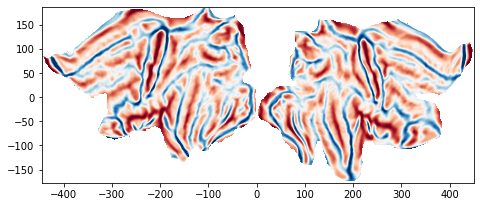

In [ ]:
curv_vertices = cx.db.get_surfinfo(subject='hcp_999999', type='curvature')
cx.quickshow(curv_vertices);

### Flatmaps?

But what the hell are we looking at, even? The cortical surface or ribbon is topologically a ball per hemisphere. That is, each hemisphere can be inflated to the shape of a sphere (let's not get stuck on the question how a hemisphere can also be a sphere :-) ). Flatmaps are created by cutting the inflated cortical surface at specific locations (see the black lines in the left figure), and then letting the computer flatten the resulting mesh into a planar surface. 

<img src="https://github.com/VU-Cog-Sci/wiki/raw/master/imgs/flatten/image9.png" alt="where do we cut the surface" width="45%" style="align:left;"/> <img src="https://universe-review.ca/I10-13-BrainMap3.jpg" alt="Visual, auditory and somatosensory brain regions" width="45%" style="align:right;"/>

This flatmapping has the advantage that we can view the entire cerebral cortex in one fell swoop, but the downside is that it is hard to orient yourself to where things are. That's why we've added some lines that surround certain labeled regions of interest - they are the visual, auditory and somatosensory/motor cortex. In the right image they are the blue, red and green areas of the brain, respectively. We're using exactly the flattened surfaces of the right column in the right figure, but ours are rendered side-by-side. Recognize them from the curvature figure?

Take a few minutes to orient yourself on these surfaces, using the atlas in the right figure. Where are the darker areas of this atlas on the inflated surfaces, and where do they end up on the flattened surface? Same for the coloured regions - make sure you have an idea of where things are. This will greatly increase your maneuverability in the brain. 

You'll need that maneuverability because we'll be working with surface data in this project: all the data you will load is surface-based, and should be visualized as shown in this introduction. In many ways, surface-based fMRI data is simpler than volume-based data. Instead of 4-dimensional, it's 2-dimensional: vertices by timepoints. This makes it less of a bookkeeping hassle to use. Let's have a look at some of your fMRI time-course data!


## Loading the functional data for your project

In the cell below we're loading the functional MRI files you'll be working with. There's a different set of files that you open and read depending on the project that you'll be doing. Once loaded, though, all of these datasets have the same format - they're all formatted for the same surface that you've already plotted data into. 

In [ ]:
# Here, I'm using python's awesome f-string functionality to load the data in a structured way across hemisperes. 
# Once the data have been loaded (for plotting and stuff), we don't have to care about hemispheres so much anymore. 
# There are 3 separate versions here, one for each project-dataset.


#########################################################################################################
###############
############### pRF mapping data
###############
#########################################################################################################

# tseries_raw = np.nan_to_num(np.concatenate([load_surf_data(
#         os.path.join('/content/data/prf_mapper_59k', f'sub-02_task-prf_space-59k_hemi-{hemi}_run-median_desc-bold.func.gii'))
#          for hemi in ['L', 'R']]))

#########################################################################################################
###############
############### somatotopic mapping data
###############
#########################################################################################################

#tseries_raw = np.concatenate([load_surf_data(
#        os.path.join('/content/data/soma_mapper_59k', f'sub-01_ses-01_task-soma_run-median_space-59k_hemi-{hemi}_sg_psc.dtseries.gii'))
#         for hemi in ['L', 'R']])

#########################################################################################################
###############
############### hrf mapping data
###############
#########################################################################################################

tseries_raw = np.concatenate([load_surf_data(
         os.path.join('/content/data/hrf_mapper_59k', f'sub-012_ses-2_task-hrfmapper_run-1_bold_space-T1w_preproc_59k.{hemi}.dtseries.gii'))
          for hemi in ['L', 'R']])


# and, we'll check the shape of the data to see whether things make sense
# data should be shaped as vertices by timepoints, and each hemisphere is 59k vertices - hence the name :) 
print(tseries_raw.shape)

(118584, 440)


## Raw Data Observations
### What amount of preprocessing has already been done?

If the signals have been filtered already, there should be no drifts in the data. Also, if the data time-courses have already been z-scored or converted to percent signal change, the mean of the signals should already be 0. If the data are in 'units' of % signal change, the maximal excursions of the signal timecourse will be on the order of 10-20. If they've been z-scored, their standard deviation should be exactly 1 (duh!). 

Like we learned in the preprocessing lecture and practical, the standard deviation over time also gives us a lot of valuable information regarding signal quality in non-z-scored data. Let's have a quick look at these different aspects of the data on flatmaps. This will also show us whether we were scanning the whole brain or not - an aspect of the data acquisition that you may want to mention in your report...

**Note**
If we plot data that didn't come from pycortex's surface data itself, but from our own files, we need to supply a subject. Adding the colormap is just for clarity. 

AttributeError: ignored

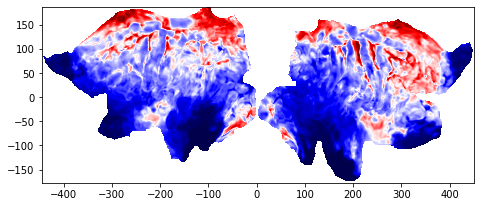

In [ ]:
# Note that we saw in the cell above that the second dimension is time, 
# so the axis on which we take the mean and standard deviation is 1
f = cx.quickshow(cx.Vertex(tseries_raw.mean(axis=1), subject='hcp_999999', cmap='seismic'));
f.suptitle('Mean over time')

f = cx.quickshow(cx.Vertex(tseries_raw.std(axis=1), subject='hcp_999999', cmap='inferno'));
f.suptitle('Standard Deviation over time');

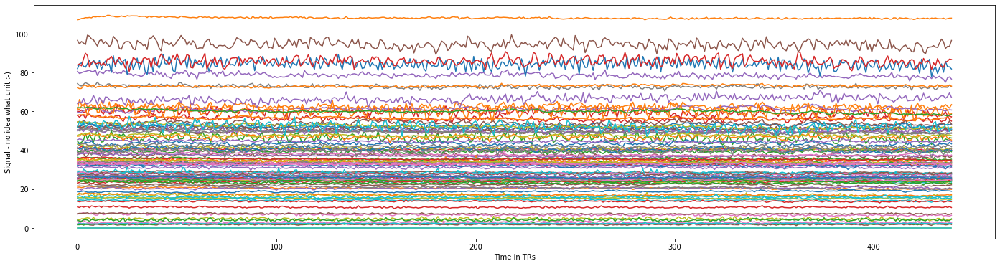

In [ ]:
# now, let's get some random time-courses to check whether there's still drift:
random_vertices = np.random.choice(np.arange(tseries_raw.shape[0]), 100)
f = plt.figure(figsize=(24,6))
plt.plot(tseries_raw[random_vertices].T)
plt.xlabel('Time in TRs')
plt.ylabel('Signal - no idea what unit :-)');

Now, depending on your dataset you may see that the top of the brain is brighter than the bottom. This is due to the fact that the top of the brain is closer to the coils. Moreover, you may see some really interesting web-like pattern on the surfaces that you've plotted. Like this:

<img style="float:right; align:right top; margin:10px; padding: 25px 25px 25px 25px;" src="https://i.imgur.com/lqPTAzK.png" alt="Model pipeline" width="500" align="right" />

What is that stuff? Why isn't it homogeneous? The answer is, we're looking at blood, and at 7 Tesla (at which all these data were acquired) these veins show up very strongly. Their presence has a strong influence on whether you can find any 'activation', as they may get in the way of what you want to find. Keep this in mind!

### Questions concerning signal quality

From these simple surface and time-course plots above, we can immediately gather a couple of things. Try to answer the following questions from both the flatmaps and the random time-courses. 

1.   have these data been z-scored or percent signal changed? **Check the colorbars!** What would they look like if they'd been z-scored?
2.   have these data been high-pass filtered? **Check the timecourses!**
3.   where do you see the biggest signal fluctuations? What are the likely origins of these fluctuations? 

You can use these insights in writing the data description section of your report! Note that there are differences between the different project-datasets, so make sure you inspect your own!

<font color='red'>-- Important: --</font>

**Your conclusions about the state of the data for your project will tell you what to do: you now have to decide whether to perform additional preprocessing, such as temporal filtering, percent signal change conversion, etc.**

## Atlas tools

It's a very powerful thing to be able to plot stuff on the entire cerebral cortex in one go. But sometimes you want to focus on a single brain region. You can use your own methods to define regions of interest, for example using a separate mapper experiment that allows you to select voxels/vertices of interest - within which you'll then perform your analysis of interest. 

But we'll use the existing multi-modal parcelation atlas from the Human Connectome Project, from the [Glasser et al Nature study](https://www.nature.com/articles/nature18933) that was mentioned a couple of times in the lectures. This is the atlas shown in the right flatmap figure above, in the 'Flatmaps' section.

The following cells show how to select a given ROI's data - something that you may want to do quite a lot in your own analyses. It serves to zoom into a specific region of interest, but also means that you can 'pilot' time-consuming analyses on smaller amounts of data while still taking care to test your entire analysis. 

In [ ]:
# we read in the atlas data, which consists of 180 separate regions per hemisphere. 
# These are labeled separately, so the labels go to 360. 
# To work with them in both hemispheres simultaneously, we mod by 180. 
atlas_data = np.concatenate([load_surf_data(
        os.path.join('/content/data/atlas', f'Q1-Q6_RelatedParcellation210.CorticalAreas_dil_Colors.59k_fs_LR.dlabel.{hemi}.gii'))
         for hemi in ['L', 'R']])
atlas_data_both_hemis = np.mod(atlas_data, 180)

### Selecting an ROI

One can now easily use a test to create boolean arrays into a specific ROI. For example, we can check which ROI is indexed by the number 1. Make sure you understand what I did with the `vmin` and `vmax` settings of the `Vertex` object! You may be able to use these little tricks later!

AttributeError: ignored

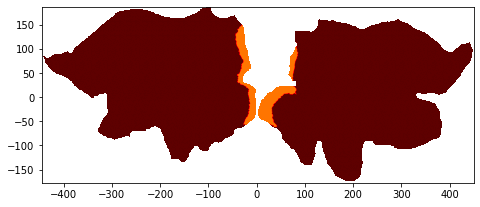

In [ ]:
f = cx.quickshow(cx.Vertex(atlas_data_both_hemis == 1, subject='hcp_999999', cmap='hot', vmin=-0.3, vmax=2.1));

This means we can also select those parts of the brain and single out the responses from just a single region of interest! That should be much more manageable. For now, we'll select the region we highlighted above, V1 - the first region of the cortical visual hierarchy. It turns out that 2 out of our 3 experiments did something very very visual, with the third also showing visual stimuli. So let's see what we end up with! Once you've understood the idea of the following code cell, feel free to experiment with the actual index of the ROI this analysis works with!

***Note 1:*** whether this raw data visualization is very informative depends on your experiment. So, don't worry if this doesn't show you anything here. 

***Note 2:*** See how I'm trying to label all my figure axes so that it's clear what the units and elements of the data are? **It's very important that you do the same for your report!**

To help you out a bit, here's a dictionary that gives you the indices in the atlas for the regions that are outlined in the flatmaps. This may help you find your way later on :-)

In [ ]:
roi_index_dict = {
    # somatosensory:
    'CS1_4': 8, 'CS2_3a': 53, 'CS3_3b': 9, 'CS4_1': 51, 'CS5_2': 52,
    # auditory:
    'A1': 24, 'PBelt': 124, 'MBelt': 173, 'LBelt': 174, '52': 103, 'RI': 104,
    # low-level visual:
    'V1': 1, 'V2': 4, 'V3': 5,
    # mid-level and high-level visual:
    'V3A': 13, 'V3B': 19, 'IPS1': 17, 'LIPv': 48, 'LIPd': 95, 
    'VIP': 49, 'FEF': 10, 'MST': 2, 'MT': 23, 'LO1': 20, 'LO2': 21, 'LO3': 159
    }

# Report Outline

This part of the notebook outlines the sections we expect your report to contain. You can use this part as a to-be-filled-in template for your project report. The total text should not be too long, so that you don't needlessly pain your long-suffering colleagues. Say, 2000 words max. 



## How many regressors? Investigating the differences in timecourses of blood oxygen level-dependent responses in fMRI data.

## Abstract
We analyzed fMRI data from a visual stimulus-related experiment in order to estimate the shape of BOLD responses. The data was obtained using a 7T scanner and "unwrapped" onto a two-dimensional surface. We compared the results obtained with and the performance of various GLM approaches - FIR with a single canonical HRF, FIR with noise regressors collected during the experiments and an HRF basis set.
We found that a temporal basis set-based model offers advantages in the form of reduced amount of regressors compared to FIR, and confirmed the observations by Kay et al. (2020) about a signifcant BOLD timecourse difference between voxels.

## Introduction

When attempting to explain the functioning of the brain using fMRI data, researchers are confronted with the problem of inferring neural activity from registered blood oxygenation changes. The assumption of all studies on human CNS functioning using blood oxygenation level-dependent (BOLD) responses is that areas in the brain that show significant enough BOLD response are those in which neural processing related to a particular task takes place - the change in blood oxygenation corresponds to an increased supply of blood to the region of the brain which is performing the task. The idealized model of the change in observed signal is the Hemodynamic Response Function. However, in reality, it's known that the HRF shape can differ from subject to subject, and even from voxel to voxel - the divergence between the actual and the presumed shape therefore poses issues with regards to interpretation of experimental data. Furthermore the signal coming from an fMRI scanner is inherently noisy and needs to be cleaned and analyzed in order to be interpretable. One approach to this problem is the usage of a general linear model (GLM), which incorporates an idealized shape of the BOLD response as a regressor, but attempts to fit correct weights to make it conform to the signal. Additionally, nuisance regressors can be added to the linear model in order to explain observed some of observed noise, such as heartbeat or head movement. 

By using various approaches to constructing the design matrix for our GLMs we aim to examine the shape of BOLD responses in our signal, and to check to what degree they appear canonical. Keeping in mind the results by Kay et al., we expect to see differences in shape timing stemming from vasculature.

## Methods 

We will first introduce the data we used for our analysis, and then describe the different linear models we constructed. 

In [ ]:
# Some Notebook Configurations 
import pandas as pd, numpy as np, matplotlib.pyplot as plt, seaborn as sns
plt.style.use("seaborn-paper")
get_ipython().magic('matplotlib inline')
get_ipython().magic("config InlineBackend.figure_format = 'retina'");plt.style.use("seaborn")
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.figsize"] = (11.25, 5.25)

### 0) Data

In this analysis, we used fMRI data.

- The data was acquired using a 7T scanner.
- The data is not volume data, but surface-based.
- We have $N=440$ timepoints (total TR).
- Each timepoint (TR) consists of 118_584 measurements.
- Since a longitudinal fissure or division separates the brain into two distinct cerebral hemispheres, we are looking at approx. 59_000 vertices per hemisphere (Recap:surface based).
- Hence  $X \in \mathcal{R}^{(59000\times2) \times 440} \approx \mathcal{R}^{118584 \times 440}$

We look at 5 random vertices to get some idea of the data

In [ ]:
seed = np.random.choice(np.arange(tseries_raw.shape[0]), 5)
pd.DataFrame(tseries_raw[seed]).T.plot(subplots=True,grid=True,xlabel="Time [TR]",title="Some Random vertices")                                                                        

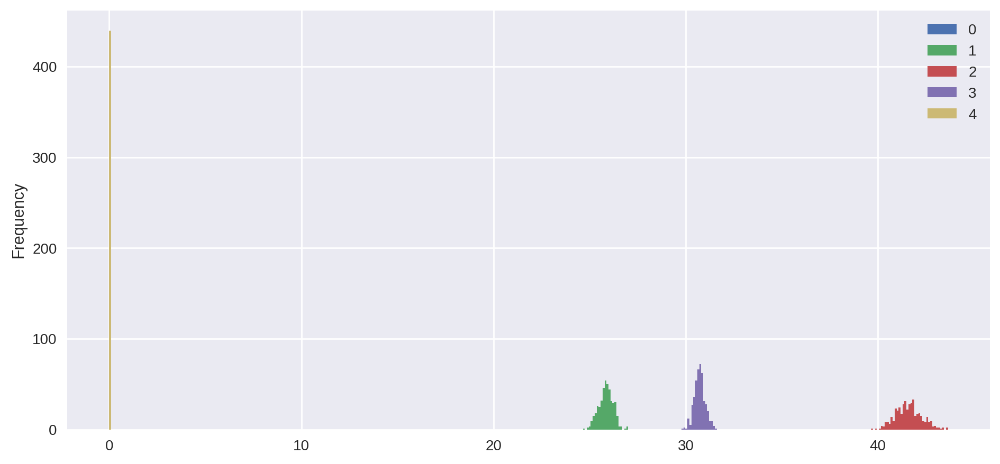

In [ ]:
pd.DataFrame(tseries_raw[seed]).T.plot.hist(bins=425,grid=True);

The data has not been Z-scored, otherwise we'd expect $x_i \sim \mathcal{N}(0,1)$. However, for the 5 random vertices we observe normal populations, although scaled in both std and location. Thus, we see that fitting kernels on those densities may be straight forward.


Next, we are checking if the data has been high pass filtered, i.e. if low frequency noise has been removed. We can either obtain the distribution of frequencies of all the measurements and see if we likely have low frequency noise left, or we can simply check if the data is trended by checking its correlation with time. Doing that we can either obtain a distribution of $\rho(x_{i}, t) \ \forall \ i$, but it should be sufficient to draw a sample of 10_000 measurements.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in double_scalars
  


Text(0.5, 1.0, '$\\rho_{x(t), t}$')

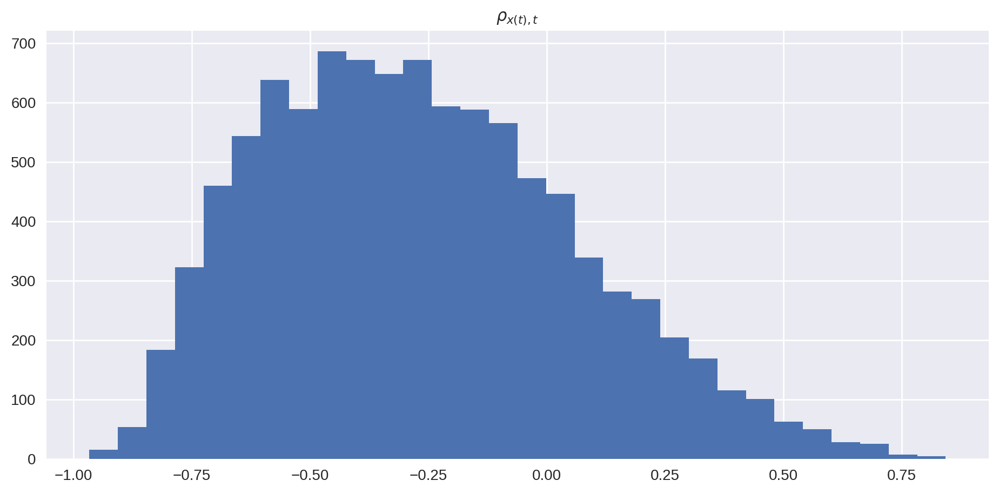

In [ ]:
sample_size = 10_000
corr = lambda x, y : ((x*y).mean()-x.mean()*y.mean())/(x.std()*y.std())
pd.DataFrame(tseries_raw[np.random.choice(np.arange(tseries_raw.shape[0]), sample_size)]).T.apply(lambda x : corr(x, np.arange(440))).hist(bins=30);
plt.title("$\\rho_{x(t), t}$",fontsize=11)

We can see that a large part of the sample has potentially a large negative drift. We conclude that we should high pass filter the data.

Next, we create a plot of the mean global signal to get a more macro view of the variability.

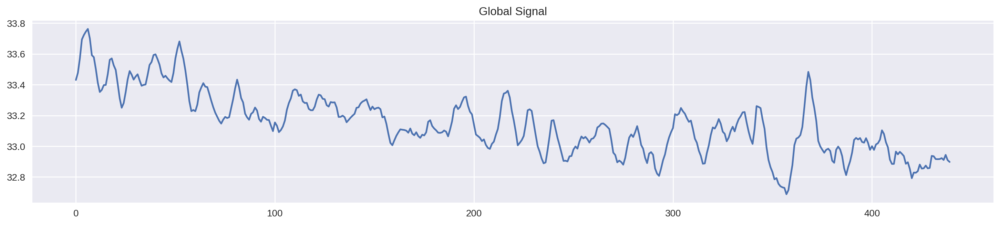

In [ ]:
pd.DataFrame(tseries_raw).mean().plot(figsize=(18,3.5),grid=True, title="Global Signal")

Next to the previously identified drift, we can also see a quasi-random global activation pattern, containing activation derivatives with unequal height and amplitude. Btw the drift is porbably due to either increasing thermal noise from the scanning device or slowly increasing heterogenity of the magnetic field.


In [ ]:
from scipy.signal import periodogram

Since we acquire one measurements every .945 seconds (TR=.945), we have $\frac{1}{TR} = \frac{1}{0.945} = 1.06$ measurements (surfaces) per second (SF=1.06). 

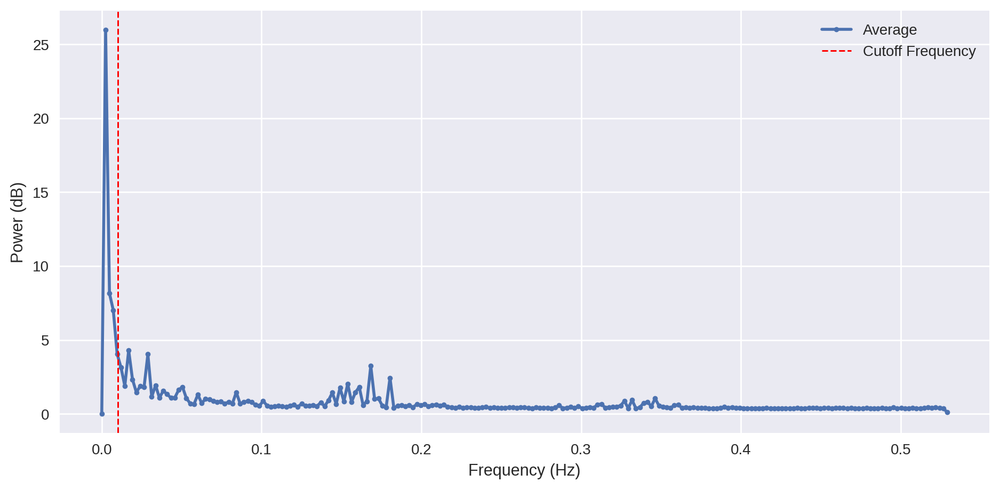

In [ ]:
TR = .945
SF = 1 / TR
freq, power = periodogram(tseries_raw, fs=SF)
pd.DataFrame({"Average" : power.mean(axis=0)}, index=freq).plot(ylabel="Power (dB)",xlabel="Frequency (Hz)",grid=True, lw=2, style=".-");
plt.axvline(x=0.01,color='r',ls='dashed', lw=1.0802);plt.legend(["Average","Cutoff Frequency"])

We are inspecting the mean powers of the frequencies of all the voxels to determine the existence of low frequency noise as well as a reasonable threshold. We see that there is a significant amount of low-frequency components in the signal. The threshold indicated by the dashed red line is 0.01 Hz. If we use a cutoff of 0.01Hz, then every signal that takes longer than 100s to complete its cyvle is removed. We think that this is a reasonable choice, given we cannot confidently identify the signal components which account for powers in $[.01, \approx .03]$, meaning they might be of interest, and should be therefore left in the data. To implement the proposed filter, we use a gaussian filter with sigma calculated according to $\sigma \approx \frac{\mathrm{cutoff}_{sec}}{2 \cdot \mathrm{TR}_{sec}} =\frac{100}{2 \times .945}= 52.91 $

In [ ]:
from scipy.ndimage import gaussian_filter as Ker

We use a normal kernel to extract the low frequency noise, the drift.

In [ ]:
TR=.945
sigma = 100 / (2 * TR) 
drift = Ker(tseries_raw, sigma)

In [ ]:
drift.shape == tseries_raw.shape

True

After extracting the low frequency component, we remove it from the signal and inspect the data one more time to ensure the drift has been removed.

In [ ]:
tseries_filt = tseries_raw - drift

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f01ee447450>,
      dtype=object)

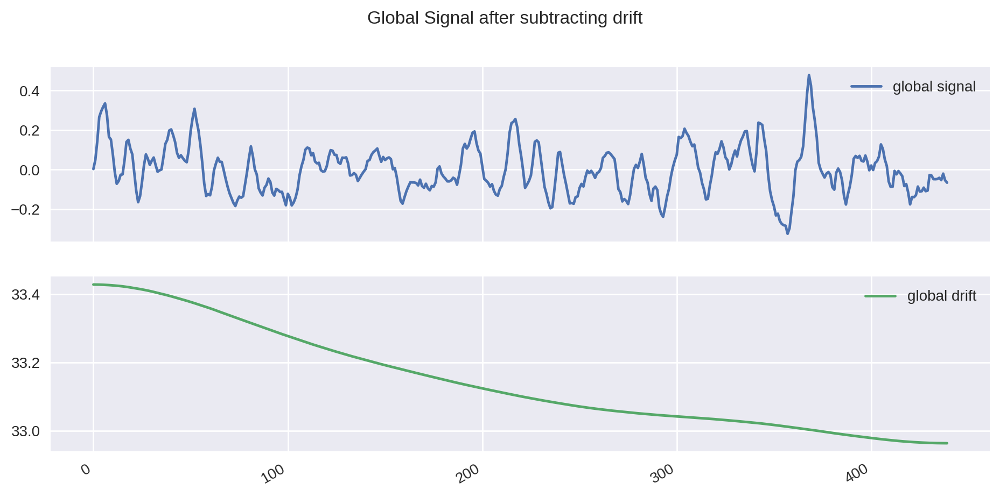

In [ ]:
pd.DataFrame({"global signal": tseries_filt.mean(0),
                 "global drift" : drift.mean(0) }).plot(subplots=True,grid=True, title="Global Signal after subtracting drift")

Text(0.5, 1.0, '$\\rho_{x(t), t}$ after subtracting drift')

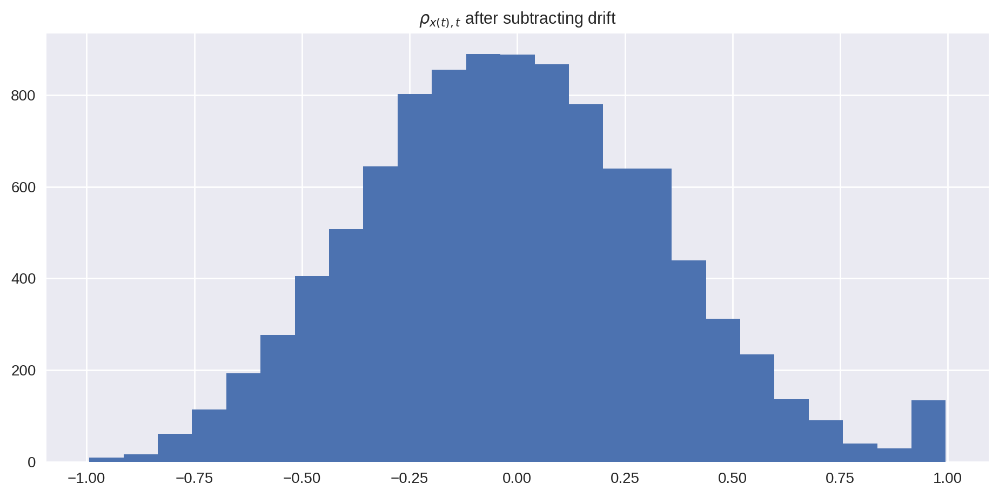

In [ ]:
sample_size = 10_000
pd.DataFrame(tseries_filt[np.random.choice(np.arange(tseries_filt.shape[0]), sample_size)]).T.apply(lambda x : corr(x, np.arange(440))).hist(bins=25);
plt.title("$\\rho_{x(t), t}$ after subtracting drift",fontsize=11)

After removing the drift part of the data, we expect different centers of our previously observed 5 random samples. We expect that the scale shouldnt change.

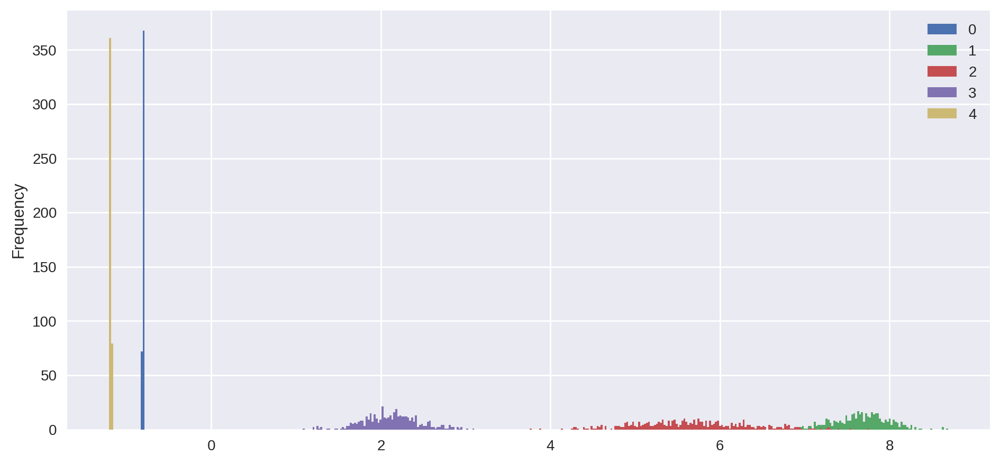

In [ ]:
pd.DataFrame(tseries_filt[seed]).T.plot.hist(bins=425,grid=True);

As expected, the vertices densities change in location, but not in scale. Given the arbitrary nature of the raw data, we should not care about it as long as variance isnt lost.

Now, we transform the data. We test three types of possible transformations.

In [ ]:
psc = lambda data, base : np.nan_to_num(((data.T/np.mean(data, 1)).T - 1) * 100) if base=="mean" else  np.nan_to_num(((data.T/np.median(data, 1)).T - 1) * 100)

In [ ]:
tseries_filt_psc_median = pd.DataFrame(psc(tseries_filt, base="median")).T
tseries_filt_psc_mean = pd.DataFrame(psc(tseries_filt, base="mean")).T
tseries_filt_z = pd.DataFrame((tseries_filt.T - np.mean(tseries_filt,1))/np.std(tseries_filt,1))

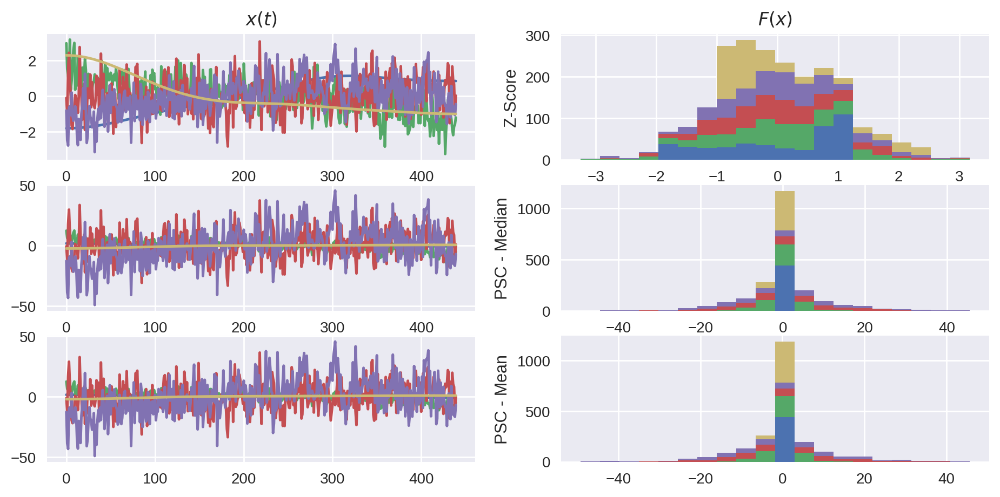

In [ ]:
fig, axes = plt.subplots(3,2)
tseries_filt_z[seed].plot.hist(stacked=True,bins=20,ax=axes[0,1],legend=False,title="$F(x)$");axes[0,1].set_ylabel("Z-Score")
tseries_filt_psc_median[seed].plot.hist(stacked=True,bins=20,ax=axes[1,1],legend=False);axes[1,1].set_ylabel("PSC - Median")
tseries_filt_psc_mean[seed].plot.hist(stacked=True,bins=20,ax=axes[2,1],legend=False);axes[2,1].set_ylabel("PSC - Mean")

tseries_filt_z[seed].plot(ax=axes[0,0],legend=False,title="$x(t)$")
tseries_filt_psc_median[seed].plot(ax=axes[1,0],legend=False)
tseries_filt_psc_mean[seed].plot(ax=axes[2,0],legend=False)

Although those random vertices we collected initially shouldnt serve as the representatives of the data, we think that a Z transformation and the resuslting distributional properties of the data are prefered over both mean and median psc.

### Autocorrelation

A significant source of problems with fitting models is autocorrelation. We check for autocorrelation in $y$. We again use a sample of 10k vertices to safe some time.

#### A.) Naive Autocorrelation

In [ ]:
sample_size = 10_000
seed = np.random.choice(np.arange(tseries_raw.shape[0]), sample_size)
tseries_filt[np.random.choice(np.arange(tseries_filt.shape[0]), sample_size)]
autocorrs = pd.DataFrame({ __ : [ tseries_filt_z[_].autocorr(lag = __ ) for _ in seed ] for __ in range(1,11) }, index=seed)

Text(0, 0.5, 'AC')

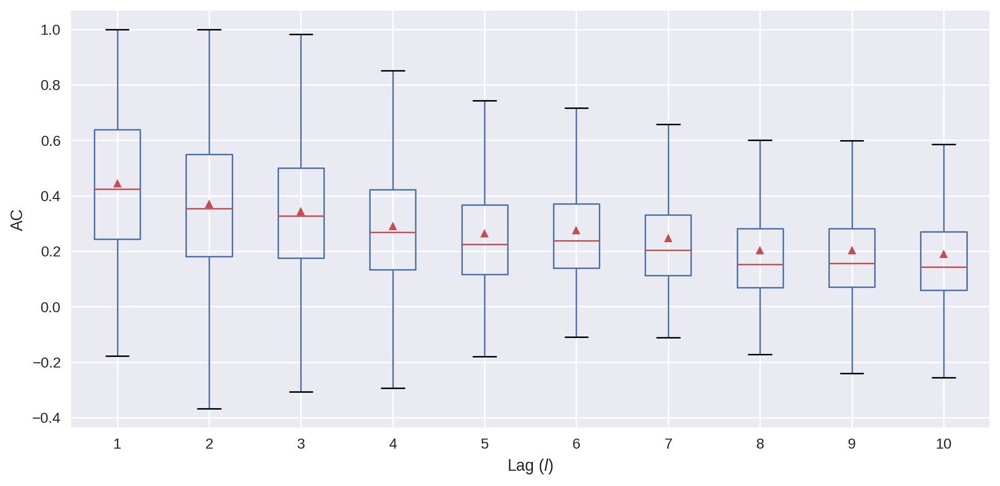

In [ ]:
autocorrs.boxplot(showfliers=False, showmeans=True);plt.xlabel(r"Lag ($l$)");plt.ylabel(r"AC")

The distributions of $\rho_{x(t), x(t-l)}$suggest that while the average autocorrelation is decreasing, it is still extremely strong, indicating an AR process. While this is a very bad observation, it is also highly unprecise when using the plain vanilla $\rho$ which does not take intra-window coefficients into account, essentially making every AR with a higher order (i.e $l$) of 2 nonsensical.

#### B.) Partial Autocorrelation

In order to account for window delta bias, we can estimate the partial autocorrelation. Although the estimation of the PACF is non-trivial and we'll be using OLS for AR betas here, adding another layer of complexity, the naive autocorrelation is usually considered useless for lags > 2.

In [ ]:
from statsmodels.tsa.stattools import pacf
p_autocorrs = tseries_filt_z[seed].apply(lambda x : pacf(x, 10).flatten()[1:]).T
p_autocorrs.columns = autocorrs.columns

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
/usr/local/lib/python3.7/dist-packages/statsmodels/regression/linear_model.py:1358: RuntimeWarning: invalid value encountered in sqrt
  return rho, np.sqrt(sigmasq)


Text(0, 0.5, 'PAC')

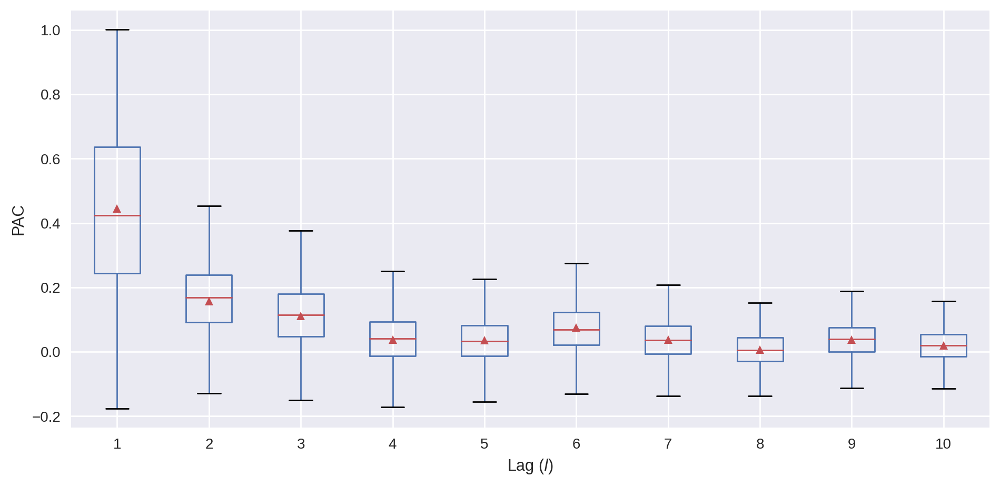

In [ ]:
p_autocorrs.boxplot(showfliers=False, showmeans=True);plt.xlabel(r"Lag ($l$)");plt.ylabel(r"PAC")

#### B.) Event data

The experiment which we are considering involved presenting the subject with visual stimuli. The times of presentation were recorded, together with times of events of unrelated nature - eye movements (saccades) and blinking. We thus have 3 different types of events, characterized by their type (eye blinks, eye movement, visual stimulus) and by their temporal appearance $t$ (Not TR).

In [ ]:
!ls /content/data/hrf_mapper_59k/

# we'll load all the different event times we have, but will focus on the stimulus presentations for now.
blink_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_blink-times.tsv'), delimiter='\t')
sacc_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_sacc-times.tsv'), delimiter='\t')
stim_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_stim-times.tsv'), delimiter='\t')

# and, for convenience, we'll also read in the confounds for later use here. 
# for example, the bold_confounds dataframe contains slow drift regressors...
# these are called CosineXXX.
import pandas as pd
bold_confounds = pd.read_csv(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_bold_confounds.tsv'), delimiter='\t')

sub-012_ses-2_task-hrfmapper_run-1_blink-times.tsv
sub-012_ses-2_task-hrfmapper_run-1_bold_confounds.tsv
sub-012_ses-2_task-hrfmapper_run-1_bold_space-T1w_preproc_59k.L.dtseries.gii
sub-012_ses-2_task-hrfmapper_run-1_bold_space-T1w_preproc_59k.R.dtseries.gii
sub-012_ses-2_task-hrfmapper_run-1_sacc-times.tsv
sub-012_ses-2_task-hrfmapper_run-1_stim-times.tsv


### Modeling

##1
For our first approach we construct a GLM with an FIR matrix of `n=20` timepoints, with regressors for stimulus responses, as well as saccade and blink events. We fit the actual times to the TRs (`TR=0.945s`). 

In [ ]:
tr = 0.945
n_timepoints=20
event_TRs = np.round(stim_times/tr).astype(int)

stim_TRs = np.floor(stim_times/tr).astype(int)
sacc_TRs = np.floor(sacc_times/tr).astype(int)
blink_TRs = np.floor(blink_times/tr).astype(int)

# make sure no responses we try to fit run over the duration of our data
# this happens for the saccade times
event_TRs = event_TRs[event_TRs < (tseries_raw.shape[1] - n_timepoints)]

stim_TRs = stim_TRs[stim_TRs < (tseries_raw.shape[1] - n_timepoints)]
sacc_TRs = sacc_TRs[sacc_TRs < (tseries_raw.shape[1] - n_timepoints)]
blink_TRs = blink_TRs[blink_TRs < (tseries_raw.shape[1] - n_timepoints)]

In [ ]:
tseries_filt_z.shape

(440, 118584)

In [ ]:
tseries_raw.shape

(118584, 440)

In [ ]:
np.zeros((tseries_filt_z.shape[0], n_timepoints)).shape

(440, 20)

In [ ]:
np.zeros((tseries_raw.shape[1], n_timepoints)).shape

(440, 20)

We then create and visually inspect the design matrix.

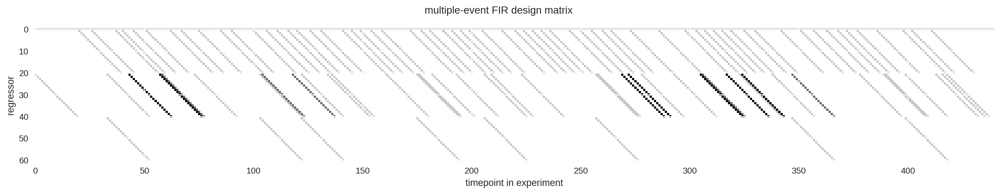

In [ ]:
total_dm = np.zeros((tseries_raw.shape[1], n_timepoints))
sacc_dm = np.zeros((tseries_raw.shape[1], n_timepoints))
blink_dm = np.zeros((tseries_raw.shape[1], n_timepoints))
stim_dm = np.zeros((tseries_raw.shape[1], n_timepoints))

for etr in event_TRs:
    total_dm[etr:etr+n_timepoints,:] += np.eye(n_timepoints)
for etr in stim_TRs:
    stim_dm[etr:etr+n_timepoints,:] += np.eye(n_timepoints)
for etr in sacc_TRs:
    sacc_dm[etr:etr+n_timepoints,:] += np.eye(n_timepoints)
for etr in blink_TRs:
    blink_dm[etr:etr+n_timepoints,:] += np.eye(n_timepoints)

event_dm = np.hstack([stim_dm, sacc_dm, blink_dm])
glm_dm = np.hstack((np.ones((1,tseries_raw.shape[1])).T, event_dm))

plt.figure(figsize=(20,3))
plt.imshow(glm_dm.T)
plt.suptitle('multiple-event FIR design matrix')
plt.ylabel('regressor')
plt.xlabel('timepoint in experiment');

In [ ]:
blink_dm.shape, stim_dm.shape, sacc_dm.shape, glm_dm.shape

((440, 20), (440, 20), (440, 20), (440, 61))

In [ ]:
tseries_filt_z.shape

(440, 118584)

In [ ]:
tseries_filt_z = tseries_filt_z.values
tseries_filt_psc_mean = tseries_filt_psc_mean.values
tseries_filt_psc_median = tseries_filt_psc_median.values

AttributeError: ignored

We use `np`'s `lstsq` function to fit the GLM to the sanitized data using ordinary least squares. We also compute the R-squared value for the fit.

In [ ]:
betas = np.linalg.lstsq(glm_dm, tseries_filt_z)[0]
yhat = betas.T@glm_dm.T
rsq = 1-(yhat-tseries_filt_z.T).var(1)/tseries_filt_z.T.var(1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  """Entry point for launching an IPython kernel.


The fitted GLM contains beta weights for the timecourses of every voxel in the brain. As we do not suspect voxels outside of V1, V2 and V3 to take part in the observed neural activity, we filter the results to only include voxels in these regions.

By manually adjusting the threshold for R-squared, we select the most successfully modeled voxels.

In [ ]:
rsq_threshold = 0.525
rsq_mask = rsq > rsq_threshold
V1_mask = atlas_data_both_hemis == roi_index_dict['V1']
V2_mask = atlas_data_both_hemis == roi_index_dict['V2']
V3_mask = atlas_data_both_hemis == roi_index_dict['V3']

responsive_V1_vertex_rsq = rsq[rsq_mask & V1_mask]
responsive_V2_vertex_rsq = rsq[rsq_mask & V2_mask]
responsive_V3_vertex_rsq = rsq[rsq_mask & V3_mask]

#V1
responsive_V1_vertex_FIR_timecourses = betas[1:,rsq_mask & V1_mask]
responsive_V1_vertex_FIR_stim_tc = betas[1:21,rsq_mask & V1_mask]
responsive_V1_vertex_FIR_sacc_tc = betas[21:41,rsq_mask & V1_mask]
responsive_V1_vertex_FIR_blink_tc = betas[41:,rsq_mask & V1_mask]

#V2
responsive_V2_vertex_FIR_timecourses = betas[1:,rsq_mask & V2_mask]
responsive_V2_vertex_FIR_stim_tc = betas[1:21,rsq_mask & V2_mask]
responsive_V2_vertex_FIR_sacc_tc = betas[21:41,rsq_mask & V2_mask]
responsive_V2_vertex_FIR_blink_tc = betas[41:,rsq_mask & V2_mask]
#V3
responsive_V3_vertex_FIR_timecourses = betas[1:,rsq_mask & V3_mask]
responsive_V3_vertex_FIR_stim_tc = betas[1:21,rsq_mask & V3_mask]
responsive_V3_vertex_FIR_sacc_tc = betas[21:41,rsq_mask & V3_mask]
responsive_V3_vertex_FIR_blink_tc = betas[41:,rsq_mask & V3_mask]

We plot the timecourses of the stimulus responses for the selected voxels, as well as the modeled blink and saccade-induced nuisance signals.

351 responsive voxels detected in V1 using threshold 0.525
190 responsive voxels detected in V2 using threshold 0.525
49 responsive voxels detected in V3 using threshold 0.525


Text(0.5, 0, 'time [s]')

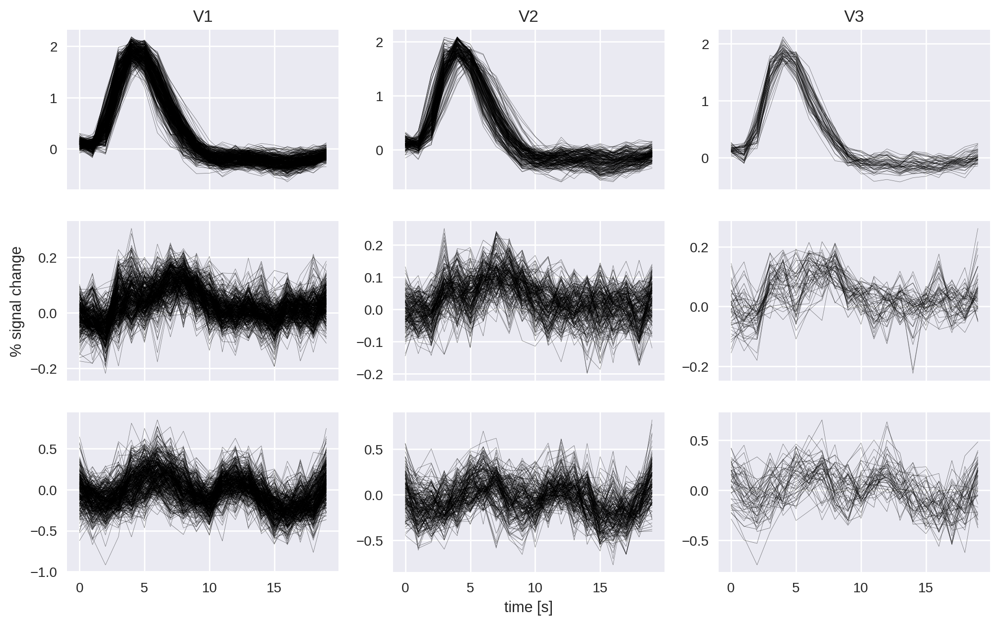

In [ ]:
print(f'{responsive_V1_vertex_FIR_timecourses.shape[1]} responsive voxels detected in V1 using threshold {rsq_threshold}')

fig,axes = plt.subplots(3,3,figsize=(12,7.25), sharex=True)
for i, tc in enumerate(responsive_V1_vertex_FIR_stim_tc.T):
    axes[0,0].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V1_vertex_rsq[i]);
for i, tc in enumerate(responsive_V1_vertex_FIR_sacc_tc.T):
    axes[1,0].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V1_vertex_rsq[i]);
for i, tc in enumerate(responsive_V1_vertex_FIR_blink_tc.T):
    axes[2,0].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V1_vertex_rsq[i]);

print(f'{responsive_V2_vertex_FIR_timecourses.shape[1]} responsive voxels detected in V2 using threshold {rsq_threshold}')

for i, tc in enumerate(responsive_V2_vertex_FIR_stim_tc.T):
    axes[0,1].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V2_vertex_rsq[i]);
for i, tc in enumerate(responsive_V2_vertex_FIR_sacc_tc.T):
    axes[1,1].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V2_vertex_rsq[i]);
for i, tc in enumerate(responsive_V2_vertex_FIR_blink_tc.T):
    axes[2,1].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V2_vertex_rsq[i]);

print(f'{responsive_V3_vertex_FIR_timecourses.shape[1]} responsive voxels detected in V3 using threshold {rsq_threshold}')

for i, tc in enumerate(responsive_V3_vertex_FIR_stim_tc.T):
    axes[0,2].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V3_vertex_rsq[i]);
for i, tc in enumerate(responsive_V3_vertex_FIR_sacc_tc.T):
    axes[1,2].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V3_vertex_rsq[i]);
for i, tc in enumerate(responsive_V3_vertex_FIR_blink_tc.T):
    axes[2,2].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V3_vertex_rsq[i]);
    
  
axes[0,0].set_title("V1");axes[0,1].set_title("V2");axes[0,2].set_title("V3")
axes[1,0].set_ylabel('% signal change');
axes[2,1].set_xlabel('time [s]')

Above we show the three different event types and their estimated response shapes with respect to their location. The three event types have different shape and all are more significant in V1. We also notice that different peak times are evident in some V2 and V3 signals, with certain V2 voxels displaying a slower increase and decay than others.

In [ ]:
rsq_threshold = np.sort(rsq)[-11:][0] 
rsq_mask = rsq > rsq_threshold
V1_mask = atlas_data_both_hemis == roi_index_dict['V1']
V2_mask = atlas_data_both_hemis == roi_index_dict['V2']
V3_mask = atlas_data_both_hemis == roi_index_dict['V3']

responsive_V1_vertex_rsq = rsq[rsq_mask & V1_mask]
responsive_V2_vertex_rsq = rsq[rsq_mask & V2_mask]
responsive_V3_vertex_rsq = rsq[rsq_mask & V3_mask]

#V1
responsive_V1_vertex_FIR_timecourses = betas[1:,rsq_mask & V1_mask]
responsive_V1_vertex_FIR_stim_tc = betas[1:21,rsq_mask & V1_mask]
responsive_V1_vertex_FIR_sacc_tc = betas[21:41,rsq_mask & V1_mask]
responsive_V1_vertex_FIR_blink_tc = betas[41:,rsq_mask & V1_mask]

#V2
responsive_V2_vertex_FIR_timecourses = betas[1:,rsq_mask & V2_mask]
responsive_V2_vertex_FIR_stim_tc = betas[1:21,rsq_mask & V2_mask]
responsive_V2_vertex_FIR_sacc_tc = betas[21:41,rsq_mask & V2_mask]
responsive_V2_vertex_FIR_blink_tc = betas[41:,rsq_mask & V2_mask]
#V3
responsive_V3_vertex_FIR_timecourses = betas[1:,rsq_mask & V3_mask]
responsive_V3_vertex_FIR_stim_tc = betas[1:21,rsq_mask & V3_mask]
responsive_V3_vertex_FIR_sacc_tc = betas[21:41,rsq_mask & V3_mask]
responsive_V3_vertex_FIR_blink_tc = betas[41:,rsq_mask & V3_mask]

10 responsive voxels detected in V1 using threshold 0.7522876674005551
0 responsive voxels detected in V2 using threshold 0.7522876674005551
0 responsive voxels detected in V3 using threshold 0.7522876674005551


Text(0.5, 0, 'time [s]')

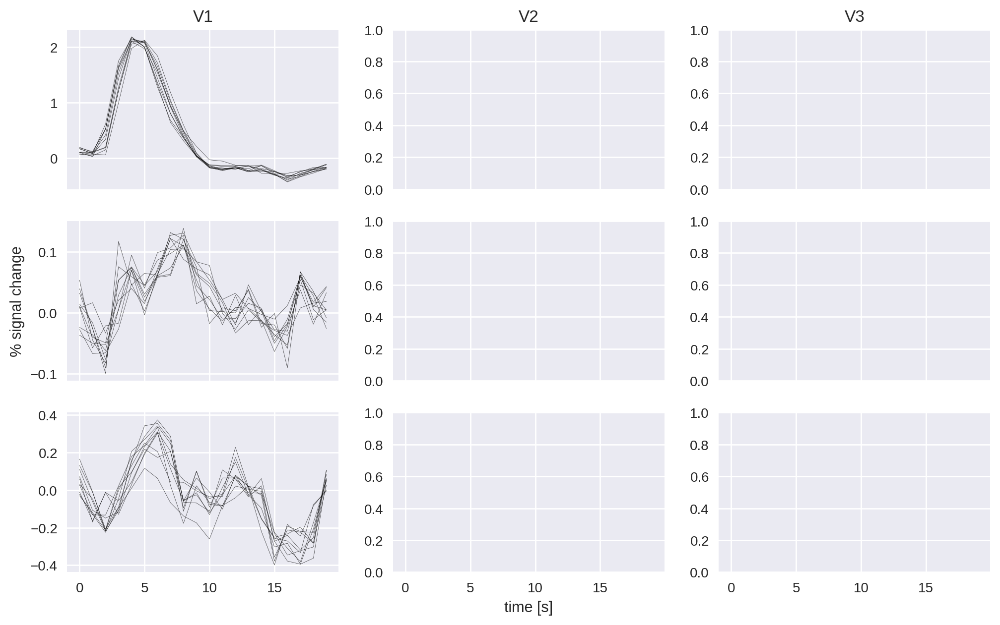

In [ ]:
print(f'{responsive_V1_vertex_FIR_timecourses.shape[1]} responsive voxels detected in V1 using threshold {rsq_threshold}')

fig,axes = plt.subplots(3,3,figsize=(12,7.25), sharex=True)
for i, tc in enumerate(responsive_V1_vertex_FIR_stim_tc.T):
    axes[0,0].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V1_vertex_rsq[i]);
for i, tc in enumerate(responsive_V1_vertex_FIR_sacc_tc.T):
    axes[1,0].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V1_vertex_rsq[i]);
for i, tc in enumerate(responsive_V1_vertex_FIR_blink_tc.T):
    axes[2,0].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V1_vertex_rsq[i]);

print(f'{responsive_V2_vertex_FIR_timecourses.shape[1]} responsive voxels detected in V2 using threshold {rsq_threshold}')

for i, tc in enumerate(responsive_V2_vertex_FIR_stim_tc.T):
    axes[0,1].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V2_vertex_rsq[i]);
for i, tc in enumerate(responsive_V2_vertex_FIR_sacc_tc.T):
    axes[1,1].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V2_vertex_rsq[i]);
for i, tc in enumerate(responsive_V2_vertex_FIR_blink_tc.T):
    axes[2,1].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V2_vertex_rsq[i]);

print(f'{responsive_V3_vertex_FIR_timecourses.shape[1]} responsive voxels detected in V3 using threshold {rsq_threshold}')

for i, tc in enumerate(responsive_V3_vertex_FIR_stim_tc.T):
    axes[0,2].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V3_vertex_rsq[i]);
for i, tc in enumerate(responsive_V3_vertex_FIR_sacc_tc.T):
    axes[1,2].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V3_vertex_rsq[i]);
for i, tc in enumerate(responsive_V3_vertex_FIR_blink_tc.T):
    axes[2,2].plot(tc[:20], c='k', lw=0.25, alpha=responsive_V3_vertex_rsq[i]);
    
  
axes[0,0].set_title("V1");axes[0,1].set_title("V2");axes[0,2].set_title("V3")
axes[1,0].set_ylabel('% signal change');
axes[2,1].set_xlabel('time [s]')

The 10 best voxels correspond to V1.

Generating a flatmap cache


AttributeError: ignored

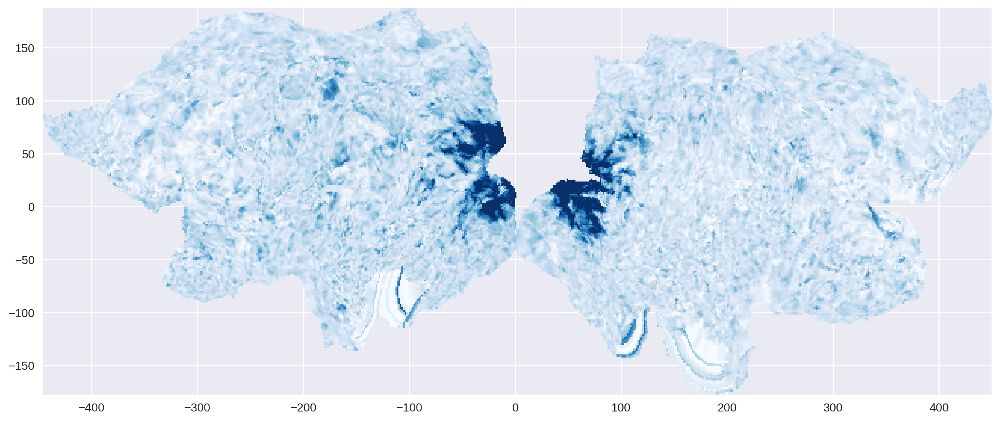

In [ ]:
cx.quickshow(cx.Vertex(rsq, subject='hcp_999999', cmap='Blues'), height=256,ax=axes[1]);

We map the R-squared values onto the flattened cortex. We see that the highest values occur within the visual cortex, which leads us to conclude that our model performs well in modeling the response to the visual stimuli.

Text(0.5, 1.0, 'Distribution of $R^2$')

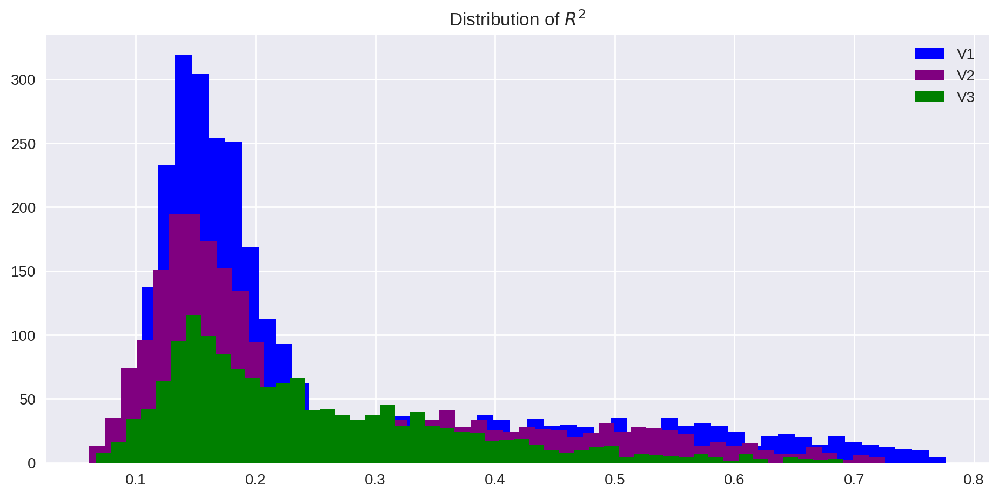

In [ ]:
ax=pd.Series(rsq[V1_mask]).hist(bins=50,color="Blue");
pd.Series(rsq[V2_mask]).hist(bins=50,ax=ax,color="purple");
pd.Series(rsq[V3_mask]).hist(bins=50,ax=ax,color="green");
plt.legend(["V1","V2","V3"]);plt.title(r"Distribution of $R^2$")

Above we show the distribution of $R^2$ for different locations.

Text(0.5, 1.0, 'V3')

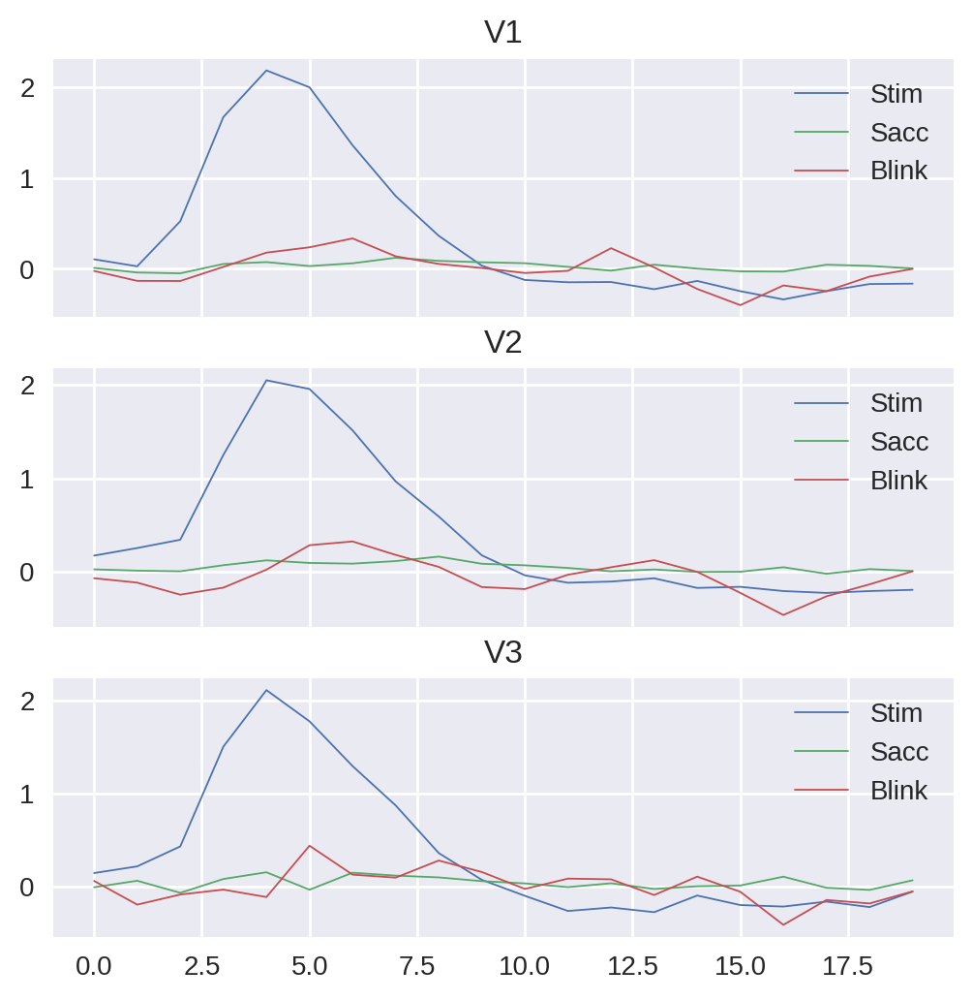

In [ ]:
fig, axes = plt.subplots(3,1, sharex=True, figsize=(6,6));
pd.DataFrame(betas[1:21,V1_mask]).T.loc[[np.argmax(rsq[V1_mask])]].T.plot(ax=axes[0],lw=.65)
pd.DataFrame(betas[21:41,V1_mask]).T.loc[[np.argmax(rsq[V1_mask])]].T.plot(ax=axes[0],lw=.65)
pd.DataFrame(betas[41:,V1_mask]).T.loc[[np.argmax(rsq[V1_mask])]].T.plot(ax=axes[0],lw=.65);axes[0].legend(["Stim", "Sacc","Blink"]);axes[0].set_title("V1")

pd.DataFrame(betas[1:21,V2_mask]).T.loc[[np.argmax(rsq[V2_mask])]].T.plot(ax=axes[1],lw=.65)
pd.DataFrame(betas[21:41,V2_mask]).T.loc[[np.argmax(rsq[V2_mask])]].T.plot(ax=axes[1],lw=.65)
pd.DataFrame(betas[41:,V2_mask]).T.loc[[np.argmax(rsq[V2_mask])]].T.plot(ax=axes[1],lw=.65);axes[1].legend(["Stim", "Sacc","Blink"]);axes[1].set_title("V2")

pd.DataFrame(betas[1:21,V3_mask]).T.loc[[np.argmax(rsq[V3_mask])]].T.plot(ax=axes[2],lw=.65)
pd.DataFrame(betas[21:41,V3_mask]).T.loc[[np.argmax(rsq[V3_mask])]].T.plot(ax=axes[2],lw=.65)
pd.DataFrame(betas[41:,V3_mask]).T.loc[[np.argmax(rsq[V3_mask])]].T.plot(ax=axes[2],lw=.65);axes[2].legend(["Stim", "Sacc","Blink"]);axes[2].set_title("V3")

Above we show the vertices with the highest $R^2$ with respect to their location.

Now we plot the avergae timecourses (i.e averaged over the event types) with respect to location.

#### Average Event Timecourses per region




Text(0.5, 0, 'Post Event Time')

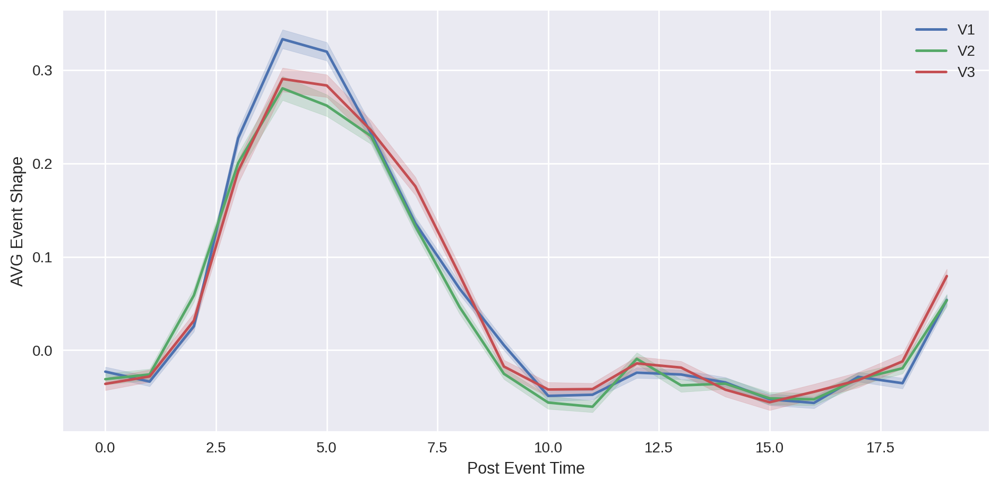

In [ ]:
V1_AVG=((pd.DataFrame(betas[1:21,V1_mask]).T + pd.DataFrame(betas[21:41,V1_mask]).T + pd.DataFrame(betas[41:,V1_mask]).T)/3).T
V2_AVG=((pd.DataFrame(betas[1:21,V2_mask]).T + pd.DataFrame(betas[21:41,V2_mask]).T + pd.DataFrame(betas[41:,V2_mask]).T)/3).T
V3_AVG=((pd.DataFrame(betas[1:21,V3_mask]).T + pd.DataFrame(betas[21:41,V3_mask]).T + pd.DataFrame(betas[41:,V3_mask]).T)/3).T

ax=sns.lineplot(x="variable", y="value", data=V1_AVG.T.melt(), ci=99)
sns.lineplot(x="variable", y="value", data=V2_AVG.T.melt(),ax=ax, ci=99)
sns.lineplot(x="variable", y="value", data=V3_AVG.T.melt(),ax=ax, ci=99);plt.legend(["V1","V2","V3"])
ax.set_ylabel("AVG Event Shape");ax.set_xlabel("Post Event Time")

We see that the signal appears stronger in V1, although the actual shape and the timing of the peaks appear almost identical.

#### Average Event Timecourses per region per event

Below we show the average timecourses per event and per region and their 99% CI (i.e 99% CI of mean with respect to $t$)




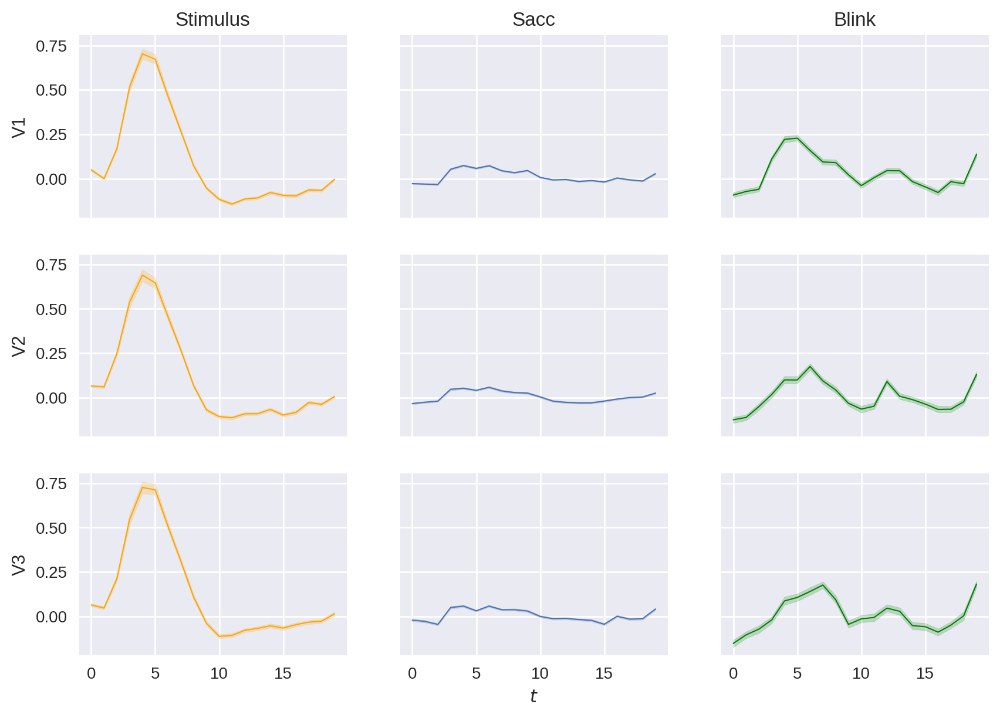

In [ ]:
fig, axes = plt.subplots(3,3,sharex=True,sharey=True, figsize=(10,7))
axes[0,0].set_ylabel("V1");axes[1,0].set_ylabel("V2");axes[2,0].set_ylabel("V3");
axes[0,0].set_title("Stimulus");axes[0,1].set_title("Sacc");axes[0,2].set_title("Blink");
axes[2,0].set_xlabel(r" ");axes[2,1].set_xlabel(r"$t$");axes[2,2].set_xlabel(r" ")
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[1:21,V1_mask]).T.melt(), ci=99,ax=axes[0,0],color="orange",lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[1:21,V2_mask]).T.melt(), ci=99,ax=axes[1,0],color="orange",lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[1:21,V3_mask]).T.melt(), ci=99,ax=axes[2,0],color="orange",lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[21:41,V1_mask]).T.melt(), ci=99,ax=axes[0,1],lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[21:41,V2_mask]).T.melt(), ci=99,ax=axes[1,1],lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[21:41,V3_mask]).T.melt(), ci=99,ax=axes[2,1],lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[41:,V1_mask]).T.melt(), ci=99,ax=axes[0,2],color="green",lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[41:,V2_mask]).T.melt(), ci=99,ax=axes[1,2],color="green",lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[41:,V3_mask]).T.melt(), ci=99,ax=axes[2,2],color="green",lw=0.75)

##2
Because information about sources of signal nuisances was recorded during the experiment, we can use it as part of our design matrix. Doing so makes it possible for the linear model to account for otherwise unexplainable noise, thus increasing the quality of our fit.

First we add the proposed confounds to the design matrix

In [ ]:
###2.)
confounds = ['stdDVARS', 'non-stdDVARS',
       'vx-wisestdDVARS', 'FramewiseDisplacement', 'tCompCor00', 'tCompCor01',
       'tCompCor02', 'tCompCor03', 'tCompCor04', 'tCompCor05', 'aCompCor00',
       'aCompCor01', 'aCompCor02', 'aCompCor03', 'aCompCor04', 'aCompCor05',
       'Cosine00', 'Cosine01', 'Cosine02', 'Cosine03', 'Cosine04']
nuisance_confounds = bold_confounds[confounds]
nuisance_confounds = np.nan_to_num(nuisance_confounds.values)
nuisance_confounds.shape

(440, 21)

In [ ]:
glm_dm2=np.hstack([glm_dm, nuisance_confounds])
glm_dm2.shape

(440, 82)

This significantly reduces our degrees of freedom. We therefore anticipate a negative effect on our t-values. However, the idea behind incorporating these nuisance regressors is that they will help filter out more noise from our signal. We also aren't interested as much in the explanatory power of our model as we are in accurately modeling the existing signal.

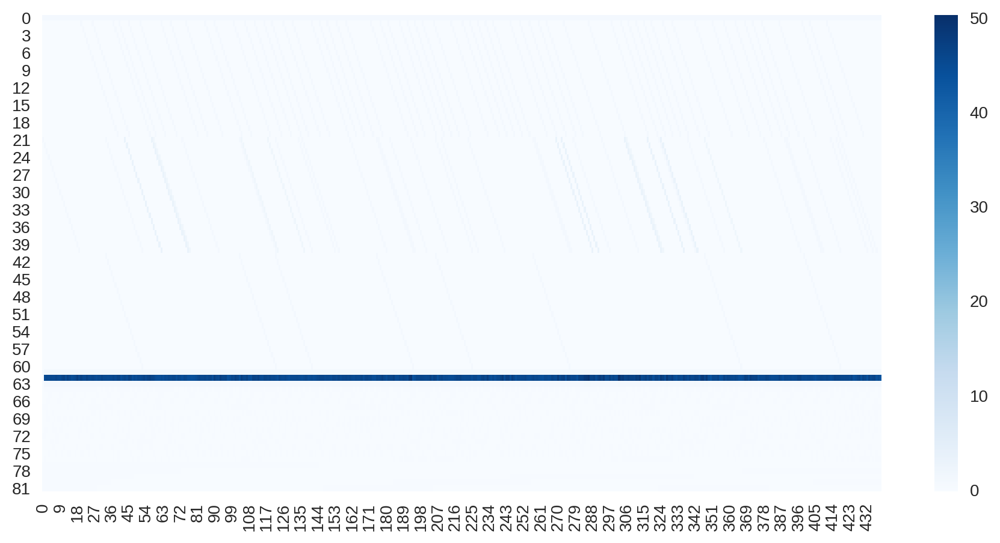

In [ ]:
sns.heatmap(glm_dm2.T,cmap="Blues")

After reconstructing the design matrix, we re-fit our GLM again.

In [ ]:
betas = np.linalg.lstsq(glm_dm2, tseries_filt_z)[0]
yhat = betas.T@glm_dm2.T
rsq = 1-(yhat-tseries_filt_z.T).var(1)/tseries_filt_z.T.var(1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  """Entry point for launching an IPython kernel.


We proceed with inspecting the results, just as in the previous cases.

Text(0.5, 0, 'Post Event Time')

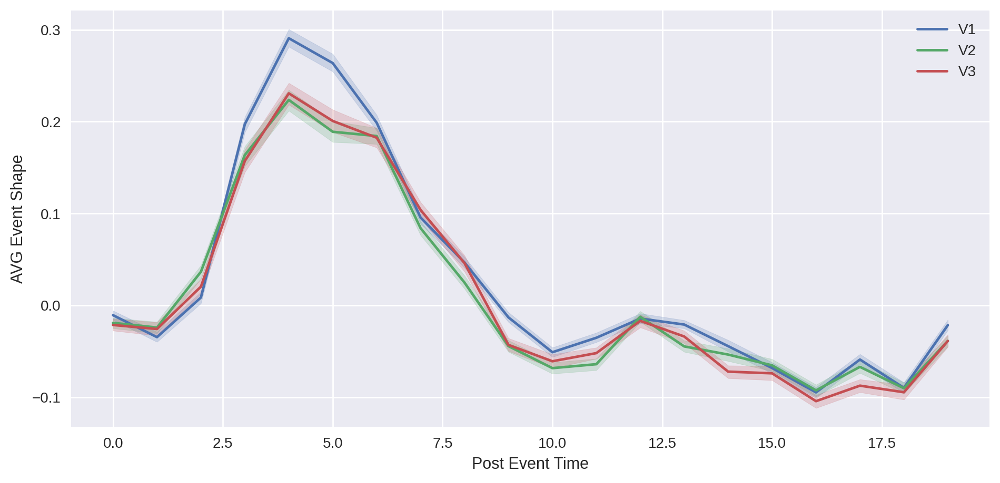

In [ ]:
V1_AVG=((pd.DataFrame(betas[1:21,V1_mask]).T + pd.DataFrame(betas[21:41,V1_mask]).T + pd.DataFrame(betas[41:61,V1_mask]).T)/3).T
V2_AVG=((pd.DataFrame(betas[1:21,V2_mask]).T + pd.DataFrame(betas[21:41,V2_mask]).T + pd.DataFrame(betas[41:61,V2_mask]).T)/3).T
V3_AVG=((pd.DataFrame(betas[1:21,V3_mask]).T + pd.DataFrame(betas[21:41,V3_mask]).T + pd.DataFrame(betas[41:61,V3_mask]).T)/3).T

ax=sns.lineplot(x="variable", y="value", data=V1_AVG.T.melt(), ci=99)
sns.lineplot(x="variable", y="value", data=V2_AVG.T.melt(),ax=ax, ci=99)
sns.lineplot(x="variable", y="value", data=V3_AVG.T.melt(),ax=ax, ci=99);plt.legend(["V1","V2","V3"])
ax.set_ylabel("AVG Event Shape");ax.set_xlabel("Post Event Time")

We notice the weakening of the mean signal, particularly the lower peaks in V2 and V3.

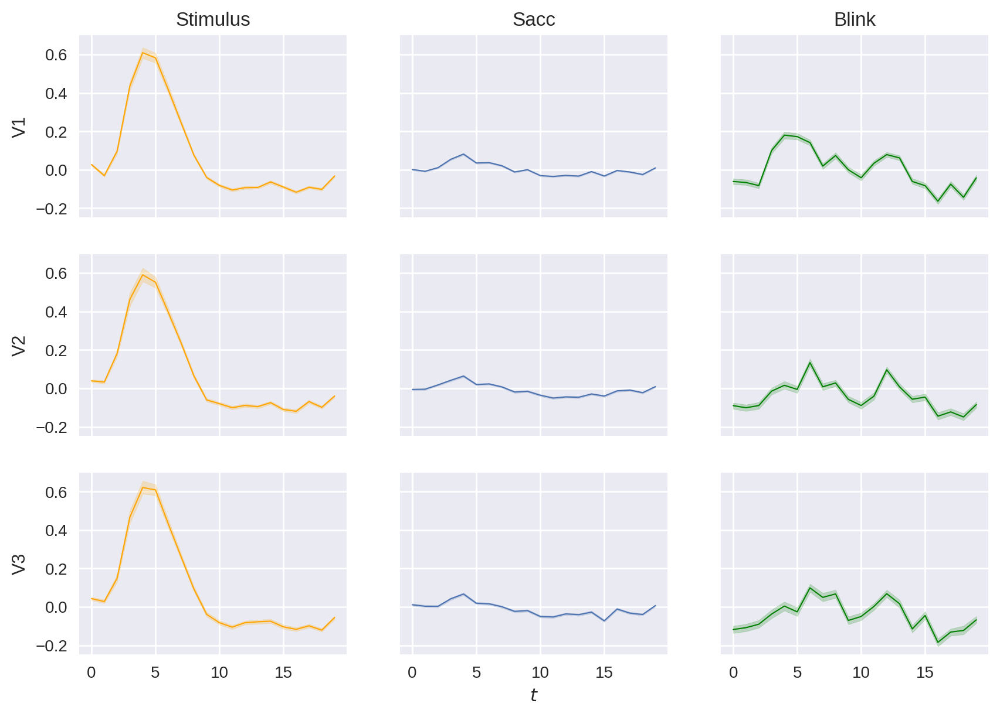

In [ ]:
fig, axes = plt.subplots(3,3,sharex=True,sharey=True, figsize=(10,7))
axes[0,0].set_ylabel("V1");axes[1,0].set_ylabel("V2");axes[2,0].set_ylabel("V3");
axes[0,0].set_title("Stimulus");axes[0,1].set_title("Sacc");axes[0,2].set_title("Blink");
axes[2,0].set_xlabel(r" ");axes[2,1].set_xlabel(r"$t$");axes[2,2].set_xlabel(r" ")
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[1:21,V1_mask]).T.melt(), ci=99,ax=axes[0,0],color="orange",lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[1:21,V2_mask]).T.melt(), ci=99,ax=axes[1,0],color="orange",lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[1:21,V3_mask]).T.melt(), ci=99,ax=axes[2,0],color="orange",lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[21:41,V1_mask]).T.melt(), ci=99,ax=axes[0,1],lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[21:41,V2_mask]).T.melt(), ci=99,ax=axes[1,1],lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[21:41,V3_mask]).T.melt(), ci=99,ax=axes[2,1],lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[41:61,V1_mask]).T.melt(), ci=99,ax=axes[0,2],color="green",lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[41:61,V2_mask]).T.melt(), ci=99,ax=axes[1,2],color="green",lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[41:61,V3_mask]).T.melt(), ci=99,ax=axes[2,2],color="green",lw=0.75)

Averaging out over each region shows that in all cases the signal had lost some strength in comparison to the no-nuisance-regressors approach - the shape of the BOLD response, ad well as the timing of the peaks, however, remained the same. We alse notice significant changes in the shape of the blink event responses.

We take another look at the $R^2$ distribution after incorporating the nuisance covariates.

Text(0.5, 1.0, 'Distribution of $R^2$')

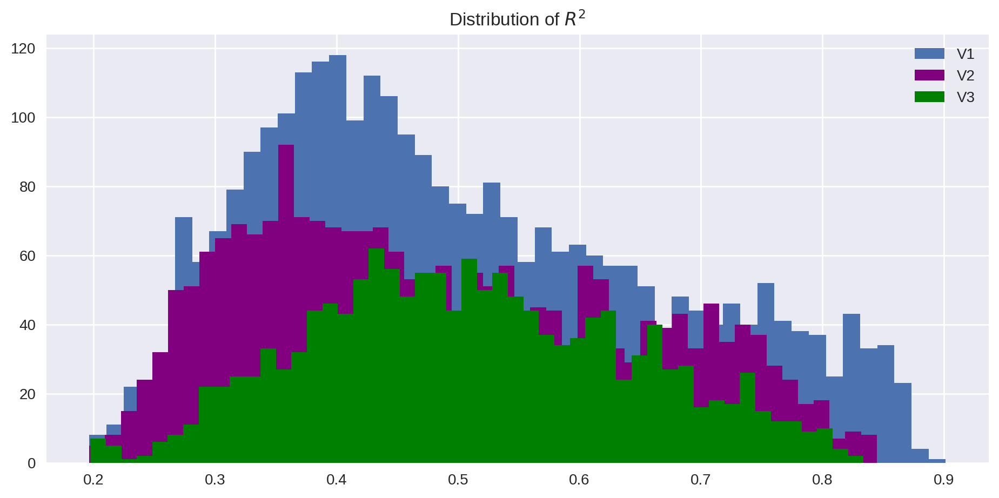

In [ ]:
ax=pd.Series(rsq[V1_mask]).hist(bins=50);
pd.Series(rsq[V2_mask]).hist(bins=50,ax=ax,color="purple");
pd.Series(rsq[V3_mask]).hist(bins=50,ax=ax,color="green");plt.legend(["V1","V2","V3"]);plt.title(r"Distribution of $R^2$")

The $R^2$ distribution is better now, but this is because $R^2 = 1 - \frac{RSS}{TSS}$ is scaled by the dimensionality of the covariate space. Although that's what we see here, there is a number of reasons why the $R^2$ is not a good indicator of a model fit, however it can be used to compare how the vertices signals' respond given the variance of the covariates.

AttributeError: ignored

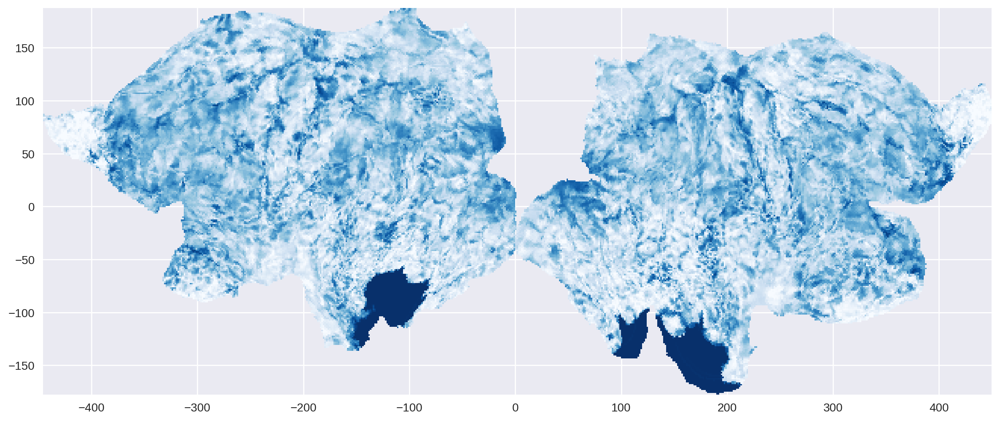

In [ ]:
cx.quickshow(cx.Vertex(rsq, subject='hcp_999999', cmap='Blues'), height=256,ax=axes[1]);

We see that the nuisance regressors are doing a good job at explaining the noise, hey are doing good at locations of the brain where we would expect the noise to be.

### T - statistics

We compute the t-statistics for the different nuisance regressors of our GLM and display it mapped onto the cortex surface.

In [ ]:
def t(i, y, X, B):
  y_hat = B.T@X.T
  N, P = X.shape
  C = np.zeros(P)
  C[i] = 1.
  sigma_hat = np.sum((y.T - y_hat) ** 2) / (N-P)
  XVAR = C@np.linalg.inv(X.T@X)@C.T
  t_dist = C@B / np.sqrt(sigma_hat * XVAR)
  return np.abs(t_dist)

AttributeError: ignored

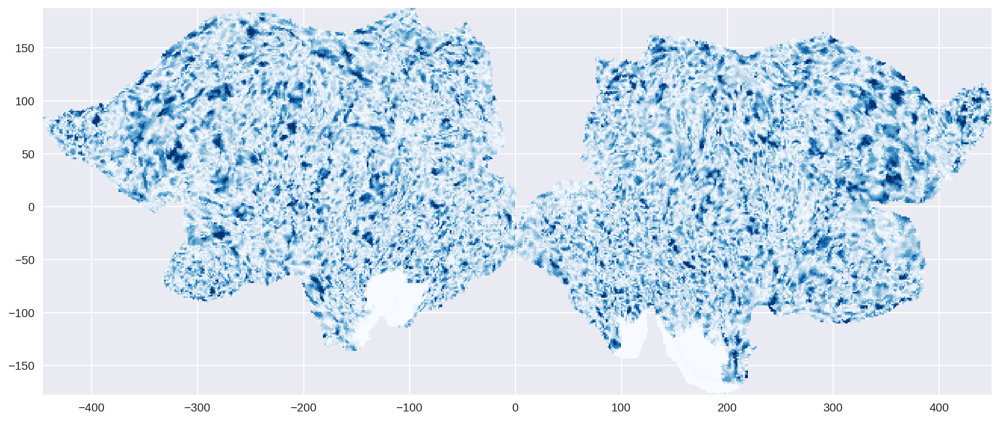

In [ ]:
# Example for beta_{i=62} : DVARS
t_density = t(i=62, y=tseries_filt_z, X=glm_dm2, B=betas)
cx.quickshow(cx.Vertex(t_density, subject='hcp_999999', cmap='Blues'), height=256,ax=axes[1]);

In [ ]:
contrasts = pd.DataFrame([t(__, y=tseries_filt_z, X=glm_dm2, B=betas) for __ in range(glm_dm2.shape[1])]).T

Text(0.5, 1.0, 'Nuisance Regressors')

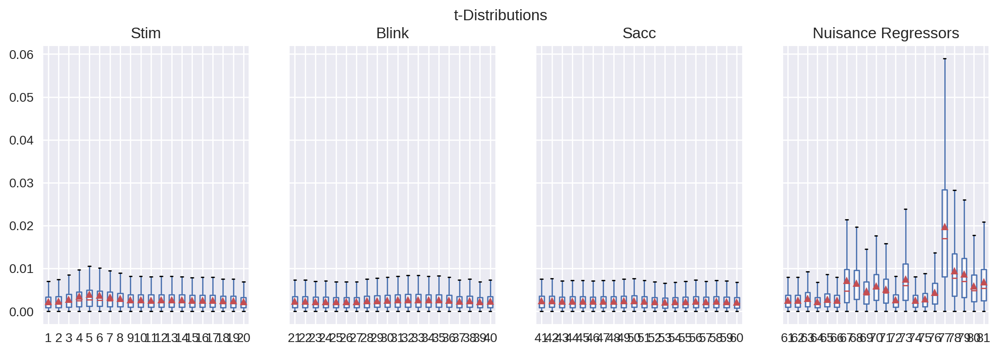

In [ ]:
fig, axes = plt.subplots(1,4, sharey=True,figsize=(13.25,4));fig.suptitle("t-Distributions")
contrasts[range(1,21)].boxplot(showfliers=False, showmeans=True,ax=axes[0]).set_title("Stim")
contrasts[range(21,41)].boxplot(showfliers=False, showmeans=True,ax=axes[1]).set_title("Blink")
contrasts[range(41,61)].boxplot(showfliers=False, showmeans=True,ax=axes[2]).set_title("Sacc")
contrasts[range(61,82)].boxplot(showfliers=False, showmeans=True,ax=axes[3]).set_title("Nuisance Regressors")

##3

As the events in the experiment did not occur exactly at TR intervals, we used integer division to assign each one of them to the appropriate TR. While this is a workable solution, it reduces the temporal resolution of our data. In order to gain back some of this temporal precision, we "harmonica" our data. This is a procedure which repeats every timecourse data point n times, creating a virtual TR that is `1/n` as big as the actual one. Doing so lets us reconstruct the BOLD response shape with a higher degree of temporal precision, since the re-aligned event times to be fitted woud now more closely match the actual measured times. 

In this report, we use 3 as the stretch factor.

Text(0.5, 1.0, 'Eye Movement')

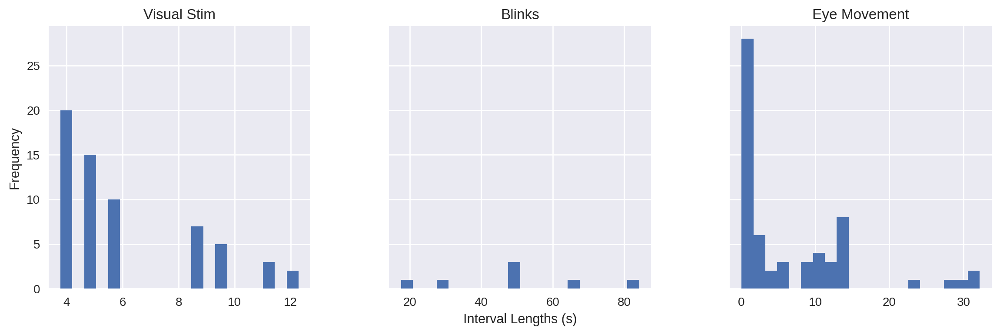

In [ ]:
fig, ax = plt.subplots(1,3,sharey=True,figsize=(14,4));
pd.DataFrame(stim_times).diff().hist(bins=20,ax=ax[0]);
ax[0].set_title("Visual Stim");ax[0].set_ylabel("Frequency")
pd.DataFrame(blink_times).diff().hist(bins=20,ax=ax[1]);
ax[1].set_title("Blinks");ax[1].set_xlabel("Interval Lengths (s)")
pd.DataFrame(sacc_times).diff().hist(bins=20,ax=ax[2]);
ax[2].set_title("Eye Movement")

The stimulus intervals are likely drawn from an exponential distribution.

Now we are going to upsample our data on the time axis by a factor of 3., which represents a synthetic increase in temporal resolution, i.e inducing $TR \gets \frac{TR}{3}$. The rest of the construction of the GLM and the fitting procedure, as well as the inspection of results are the same as previously.

In [ ]:
from scipy.signal import resample
# signals
tseries_filt_z_upsampled = resample(tseries_filt_z, 440 * 3, axis=0)
tseries_filt_psc_mean_upsampled = resample(tseries_filt_psc_mean, 440 * 3, axis=0)
tseries_filt_psc_median_upsampled = resample(tseries_filt_psc_median, 440 * 3, axis=0)
# confounds
nuisance_confounds_upsampled = resample(nuisance_confounds, 440 * 3, axis=0)

In [ ]:
tseries_filt_z.shape[0]*3 == tseries_filt_z_upsampled.shape[0] == nuisance_confounds_upsampled.shape[0]

True

In [ ]:
tr = .945 / 3
n_timepoints=20*3

stim_TRs = np.floor(stim_times/tr).astype(int)
sacc_TRs = np.floor(sacc_times/tr).astype(int)
blink_TRs = np.floor(blink_times/tr).astype(int)

# make sure no responses we try to fit run over the duration of our data
# this happens for the saccade times

stim_TRs = stim_TRs[stim_TRs < (tseries_raw.shape[1]*3 - n_timepoints)]
sacc_TRs = sacc_TRs[sacc_TRs < (tseries_raw.shape[1]*3 - n_timepoints)]
blink_TRs = blink_TRs[blink_TRs < (tseries_raw.shape[1]*3 - n_timepoints)]

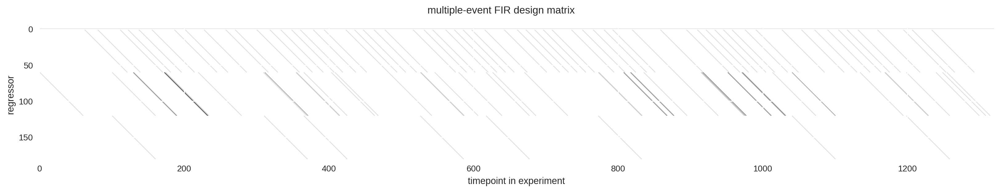

In [ ]:

sacc_dm = np.zeros((tseries_raw.shape[1]*3, n_timepoints))
blink_dm = np.zeros((tseries_raw.shape[1]*3, n_timepoints))
stim_dm = np.zeros((tseries_raw.shape[1]*3, n_timepoints))


for etr in stim_TRs:
    stim_dm[etr:etr+n_timepoints,:] += np.eye(n_timepoints)
for etr in sacc_TRs:
    sacc_dm[etr:etr+n_timepoints,:] += np.eye(n_timepoints)
for etr in blink_TRs:
    blink_dm[etr:etr+n_timepoints,:] += np.eye(n_timepoints)

event_dm = np.hstack([stim_dm, sacc_dm, blink_dm])
glm_dm = np.hstack((np.ones((1,tseries_raw.shape[1]*3)).T, event_dm))

plt.figure(figsize=(20,3))
plt.imshow(glm_dm.T)
plt.suptitle('multiple-event FIR design matrix')
plt.ylabel('regressor')
plt.xlabel('timepoint in experiment');

In [ ]:
blink_dm.shape, stim_dm.shape, sacc_dm.shape, glm_dm.shape

((1320, 60), (1320, 60), (1320, 60), (1320, 181))

In [ ]:
#add nuisance_confounds
glm_dm=np.hstack([glm_dm, nuisance_confounds_upsampled])
glm_dm.shape

(1320, 202)

In [ ]:
betas = np.linalg.lstsq(glm_dm, tseries_filt_z_upsampled)[0]
yhat = betas.T@glm_dm.T
rsq = 1-(yhat-tseries_filt_z_upsampled.T).var(1)/tseries_filt_z_upsampled.T.var(1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  """Entry point for launching an IPython kernel.


In [ ]:
# Will be inflated
rsq_threshold = 0.8
rsq_mask = rsq > rsq_threshold
V1_mask = atlas_data_both_hemis == roi_index_dict['V1']
V2_mask = atlas_data_both_hemis == roi_index_dict['V2']
V3_mask = atlas_data_both_hemis == roi_index_dict['V3']

responsive_V1_vertex_rsq = rsq[rsq_mask & V1_mask]
responsive_V2_vertex_rsq = rsq[rsq_mask & V2_mask]
responsive_V3_vertex_rsq = rsq[rsq_mask & V3_mask]

#V1
responsive_V1_vertex_FIR_timecourses = betas[1:,rsq_mask & V1_mask]
responsive_V1_vertex_FIR_stim_tc = betas[1:61,rsq_mask & V1_mask]
responsive_V1_vertex_FIR_sacc_tc = betas[61:121,rsq_mask & V1_mask]
responsive_V1_vertex_FIR_blink_tc = betas[121:181,rsq_mask & V1_mask]

#V2
responsive_V2_vertex_FIR_timecourses = betas[1:,rsq_mask & V2_mask]
responsive_V2_vertex_FIR_stim_tc = betas[1:61,rsq_mask & V2_mask]
responsive_V2_vertex_FIR_sacc_tc = betas[61:121,rsq_mask & V2_mask]
responsive_V2_vertex_FIR_blink_tc = betas[121:181,rsq_mask & V2_mask]
#V3
responsive_V3_vertex_FIR_timecourses = betas[1:,rsq_mask & V3_mask]
responsive_V3_vertex_FIR_stim_tc = betas[1:61,rsq_mask & V3_mask]
responsive_V3_vertex_FIR_sacc_tc = betas[61:121,rsq_mask & V3_mask]
responsive_V3_vertex_FIR_blink_tc = betas[121:181,rsq_mask & V3_mask]

218 responsive voxels detected in V1 using threshold 0.8
59 responsive voxels detected in V2 using threshold 0.8
27 responsive voxels detected in V3 using threshold 0.8


Text(0.5, 0, 'time [s]')

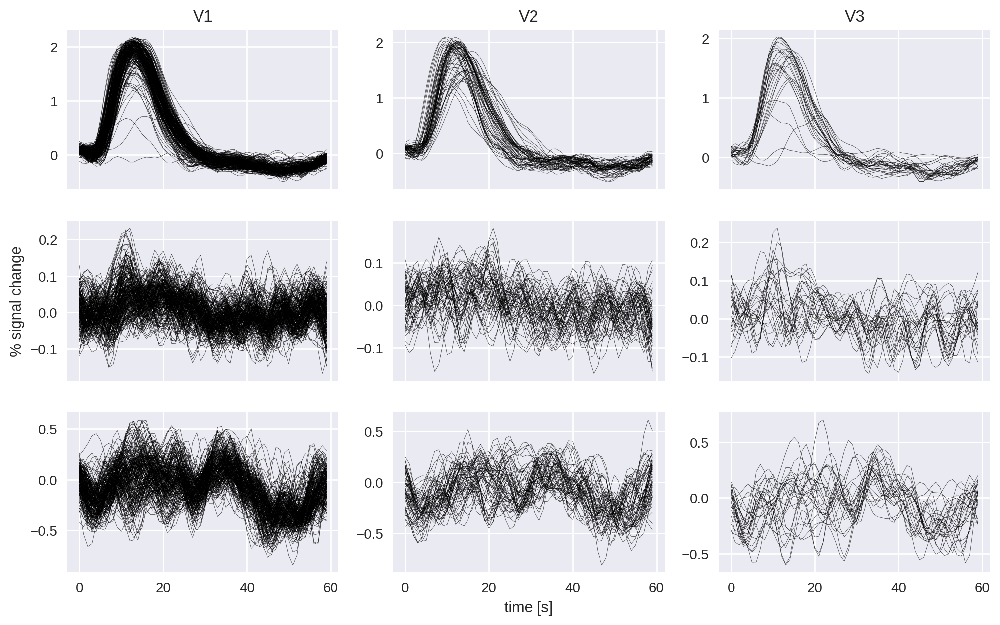

In [ ]:
print(f'{responsive_V1_vertex_FIR_timecourses.shape[1]} responsive voxels detected in V1 using threshold {rsq_threshold}')

fig,axes = plt.subplots(3,3,figsize=(12,7.25), sharex=True)
for i, tc in enumerate(responsive_V1_vertex_FIR_stim_tc.T):
    axes[0,0].plot(tc[:n_timepoints], c='k', lw=0.25, alpha=responsive_V1_vertex_rsq[i]);
for i, tc in enumerate(responsive_V1_vertex_FIR_sacc_tc.T):
    axes[1,0].plot(tc[:n_timepoints], c='k', lw=0.25, alpha=responsive_V1_vertex_rsq[i]);
for i, tc in enumerate(responsive_V1_vertex_FIR_blink_tc.T):
    axes[2,0].plot(tc[:n_timepoints], c='k', lw=0.25, alpha=responsive_V1_vertex_rsq[i]);

print(f'{responsive_V2_vertex_FIR_timecourses.shape[1]} responsive voxels detected in V2 using threshold {rsq_threshold}')

for i, tc in enumerate(responsive_V2_vertex_FIR_stim_tc.T):
    axes[0,1].plot(tc[:n_timepoints], c='k', lw=0.25, alpha=responsive_V2_vertex_rsq[i]);
for i, tc in enumerate(responsive_V2_vertex_FIR_sacc_tc.T):
    axes[1,1].plot(tc[:n_timepoints], c='k', lw=0.25, alpha=responsive_V2_vertex_rsq[i]);
for i, tc in enumerate(responsive_V2_vertex_FIR_blink_tc.T):
    axes[2,1].plot(tc[:n_timepoints], c='k', lw=0.25, alpha=responsive_V2_vertex_rsq[i]);

print(f'{responsive_V3_vertex_FIR_timecourses.shape[1]} responsive voxels detected in V3 using threshold {rsq_threshold}')

for i, tc in enumerate(responsive_V3_vertex_FIR_stim_tc.T):
    axes[0,2].plot(tc[:n_timepoints], c='k', lw=0.25, alpha=responsive_V3_vertex_rsq[i]);
for i, tc in enumerate(responsive_V3_vertex_FIR_sacc_tc.T):
    axes[1,2].plot(tc[:n_timepoints], c='k', lw=0.25, alpha=responsive_V3_vertex_rsq[i]);
for i, tc in enumerate(responsive_V3_vertex_FIR_blink_tc.T):
    axes[2,2].plot(tc[:n_timepoints], c='k', lw=0.25, alpha=responsive_V3_vertex_rsq[i]);
    
  
axes[0,0].set_title("V1");axes[0,1].set_title("V2");axes[0,2].set_title("V3")
axes[1,0].set_ylabel('% signal change');
axes[2,1].set_xlabel('time [s]')

Aside from the shapes of the responses becoming smoother, this approach makes much more obvious a crucial aspect of the difference in BOLD between voxels. We see that even among the best-fitted ones, there is a signficant variation in peak times and the width of the shapes - the differences between the "earliest" and "latest" peaks reach more than 5 seconds. This is, again, in agreement with the state of knowledge about the variation in BOLD responses caused by vasculature.

Text(0.5, 1.0, 'Distribution of $R^2$')

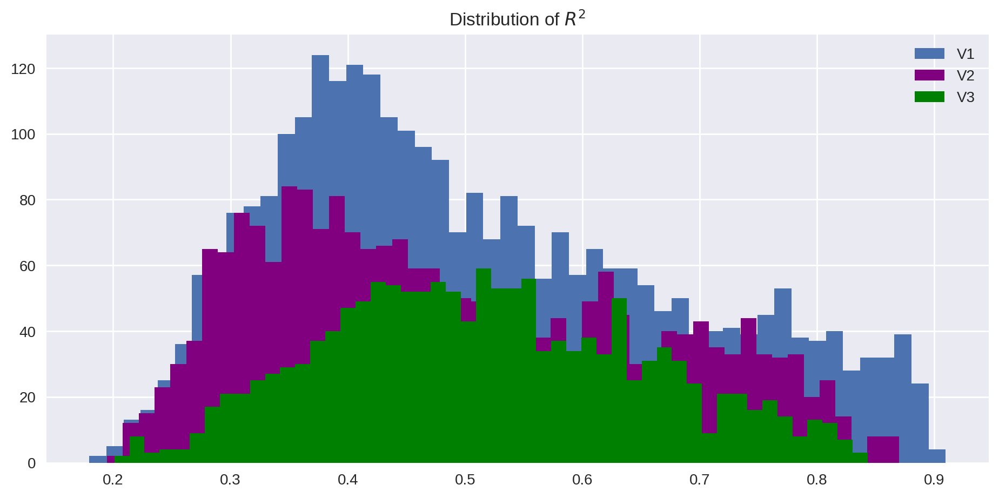

In [ ]:
ax=pd.Series(rsq[V1_mask]).hist(bins=50);
pd.Series(rsq[V2_mask]).hist(bins=50,ax=ax,color="purple");
pd.Series(rsq[V3_mask]).hist(bins=50,ax=ax,color="green");plt.legend(["V1","V2","V3"]);plt.title(r"Distribution of $R^2$")

Text(0.5, 0, 'Post Event Time')

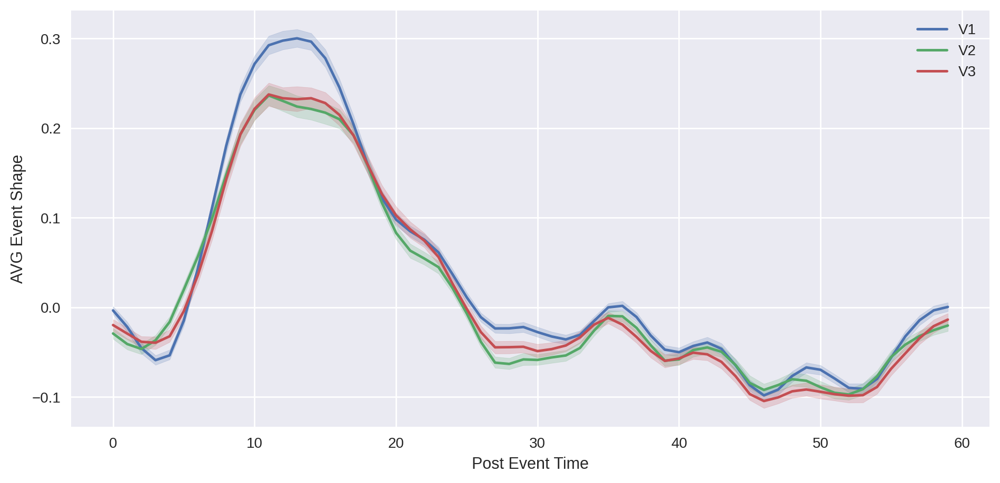

In [ ]:
V1_AVG=((pd.DataFrame(betas[1:61,V1_mask]).T + pd.DataFrame(betas[61:121,V1_mask]).T + pd.DataFrame(betas[121:181,V1_mask]).T)/3).T
V2_AVG=((pd.DataFrame(betas[1:61,V2_mask]).T + pd.DataFrame(betas[61:121,V2_mask]).T + pd.DataFrame(betas[121:181,V2_mask]).T)/3).T
V3_AVG=((pd.DataFrame(betas[1:61,V3_mask]).T + pd.DataFrame(betas[61:121,V3_mask]).T + pd.DataFrame(betas[121:181,V3_mask]).T)/3).T

ax=sns.lineplot(x="variable", y="value", data=V1_AVG.T.melt(), ci=99)
sns.lineplot(x="variable", y="value", data=V2_AVG.T.melt(),ax=ax, ci=99)
sns.lineplot(x="variable", y="value", data=V3_AVG.T.melt(),ax=ax, ci=99);plt.legend(["V1","V2","V3"])
ax.set_ylabel("AVG Event Shape");ax.set_xlabel("Post Event Time")

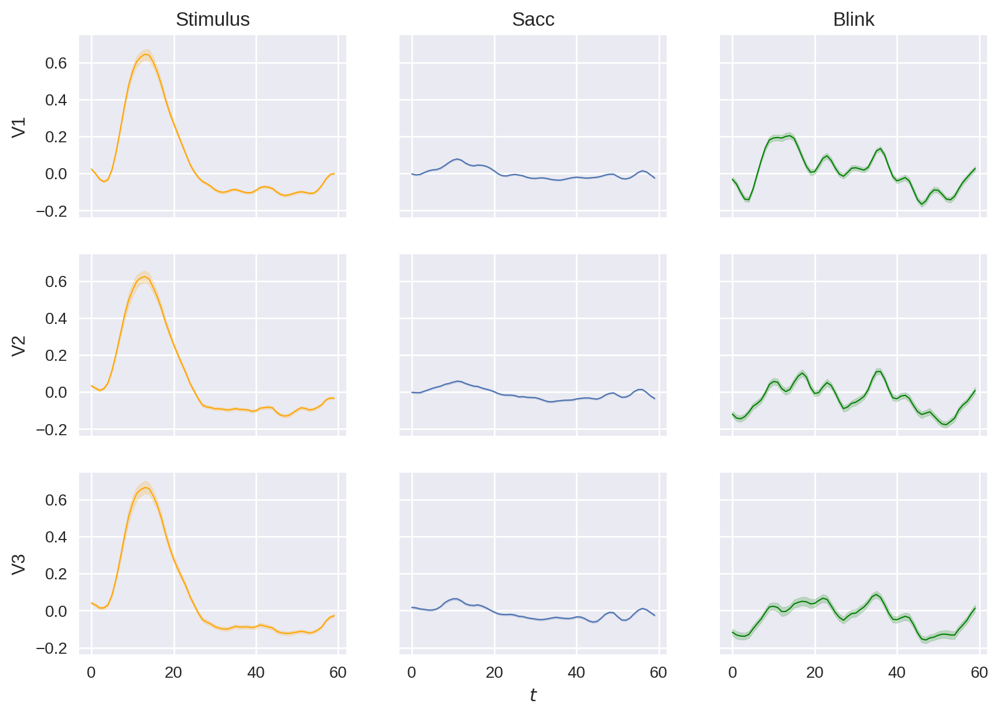

In [ ]:
fig, axes = plt.subplots(3,3,sharex=True,sharey=True, figsize=(10,7))
axes[0,0].set_ylabel("V1");axes[1,0].set_ylabel("V2");axes[2,0].set_ylabel("V3");
axes[0,0].set_title("Stimulus");axes[0,1].set_title("Sacc");axes[0,2].set_title("Blink");
axes[2,0].set_xlabel(r" ");axes[2,1].set_xlabel(r"$t$");axes[2,2].set_xlabel(r" ")
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[1:61,V1_mask]).T.melt(), ci=99,ax=axes[0,0],color="orange",lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[1:61,V2_mask]).T.melt(), ci=99,ax=axes[1,0],color="orange",lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[1:61,V3_mask]).T.melt(), ci=99,ax=axes[2,0],color="orange",lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[61:121,V1_mask]).T.melt(), ci=99,ax=axes[0,1],lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[61:121,V2_mask]).T.melt(), ci=99,ax=axes[1,1],lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[61:121,V3_mask]).T.melt(), ci=99,ax=axes[2,1],lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[121:181,V1_mask]).T.melt(), ci=99,ax=axes[0,2],color="green",lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[121:181,V2_mask]).T.melt(), ci=99,ax=axes[1,2],color="green",lw=0.75)
sns.lineplot(x="variable", y="value", data=pd.DataFrame(betas[121:181,V3_mask]).T.melt(), ci=99,ax=axes[2,2],color="green",lw=0.756)

Thus, we conclude that increasing the temporal resolution of our data allows for a better insight into the true shapes of BOLD responses within the brain. We observe that in all three regions, V1, V2, and V3, there is a significant variation of peak times and rise and decay rates of responses between the voxels.

##4

The differences in timing between the BOLD responses noted in the previous part prompt us to use a different approach in structuring our linear model.

Another way of fitting the response shapes is to use a different set of basis functions, for example a standard HRF and its time and dispersion derivative. We import these from the `nilearn` package as follows: `from nilearn.glm.first_level.hemodynamic_models import spm_hrf, spm_time_derivative, spm_dispersion_derivative`.
This lets us construct a model where the beta weights for each of these HRF shapes summed together determine the shape of the BOLD response for a given vertex/voxel. 
The temporal derivative $X_{temp}\beta_{2}$ will help to correct the lag in response peak and the dispersion derivative $X_{disp}\beta_{3}$ for differences in HRF width. 


\begin{align}
y = \beta_{0} + X_{orig}\beta_{1} + X_{temp}\beta_{2} + X_{disp}\beta_{3} + \epsilon
\end{align}

In order to be able to compare the results of this model to the FIR in Question 3, we will use 20 time points and 1 fold upsample.

We plot the resulting shapes.


In [ ]:
from nilearn.glm.first_level.hemodynamic_models import spm_hrf, spm_time_derivative, spm_dispersion_derivative

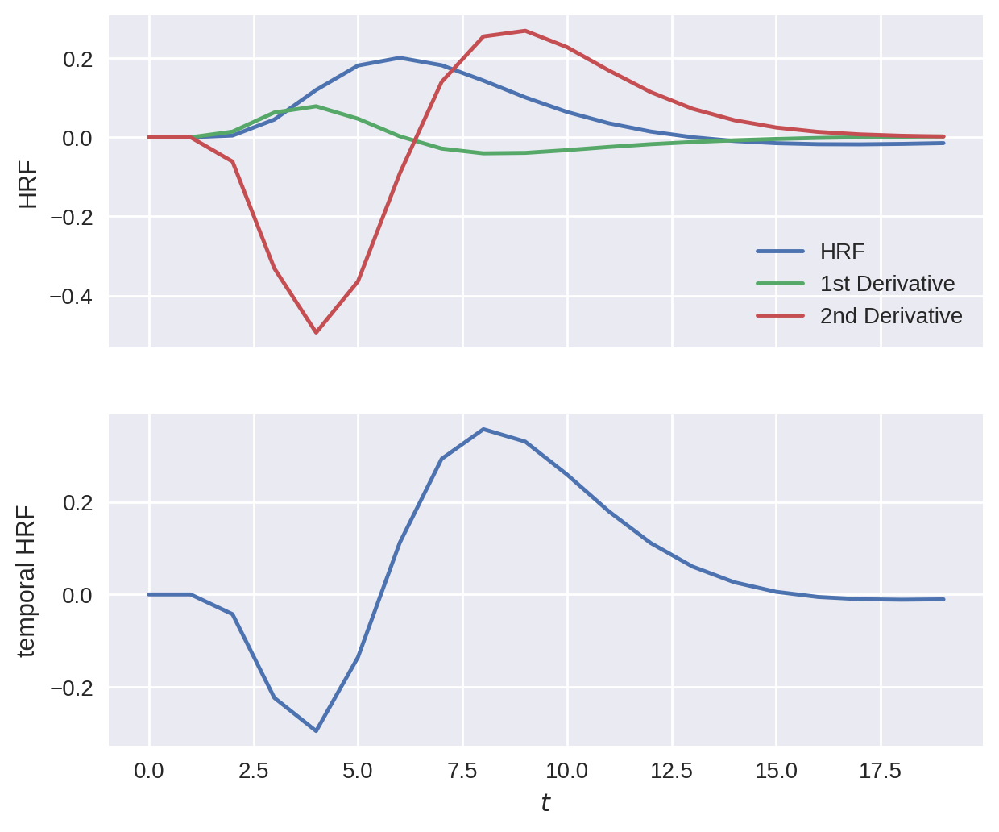

In [ ]:
upsample_fold = 1 #i.e 1 for None
n_t = 20
lag = 0
f = spm_hrf(tr=.945,oversampling=upsample_fold,time_length=n_t-1, onset=lag)
f1 = spm_time_derivative(tr=.945,oversampling=upsample_fold,time_length=n_t-1, onset=lag)
f2 = spm_dispersion_derivative(tr=.945,oversampling=upsample_fold,time_length=n_t-1, onset=lag)

fig, axes = plt.subplots(2,1,sharex=True,figsize=(7,6))
pd.Series(f).plot(ax=axes[0])
pd.Series(f1).plot(ax=axes[0])
pd.Series(f2).plot(ax=axes[0])
pd.Series(f+f1+f2).plot(ax=axes[1])
axes[0].legend(["HRF","1st Derivative", "2nd Derivative"])
axes[0].set_ylabel("HRF"); 
axes[1].set_ylabel("temporal HRF"); 
axes[1].set_xlabel(r"$t$");

Just like before, we create the predictor arrays which show at which TRs the stimuli, blinks and saccades occured.

In [ ]:
tr, n_timepoints = .945, n_t
blink_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_blink-times.tsv'), delimiter='\t')
sacc_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_sacc-times.tsv'), delimiter='\t')
stim_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_stim-times.tsv'), delimiter='\t')

stim_TRs = np.floor(stim_times/tr).astype(int)
sacc_TRs = np.floor(sacc_times/tr).astype(int)
blink_TRs = np.floor(blink_times/tr).astype(int)

stim_TRs = stim_TRs[stim_TRs < (tseries_raw.shape[1] - n_timepoints)]
sacc_TRs = sacc_TRs[sacc_TRs < (tseries_raw.shape[1] - n_timepoints)]
blink_TRs = blink_TRs[blink_TRs < (tseries_raw.shape[1] - n_timepoints)]

predictor_stim = np.array([1 if _ in stim_TRs else 0 for _ in range(440)])
predictor_sacc = np.array([1 if _ in sacc_TRs else 0 for _ in range(440)])
predictor_blink = np.array([1 if _ in blink_TRs else 0 for _ in range(440)])

The stimulus predictor is being convolved using the HRF basis set and plotted below. We do not convolve the blinks and saccades, as we do not expect they will follow the HRF shape.

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f01d4e2e190>,
      dtype=object)

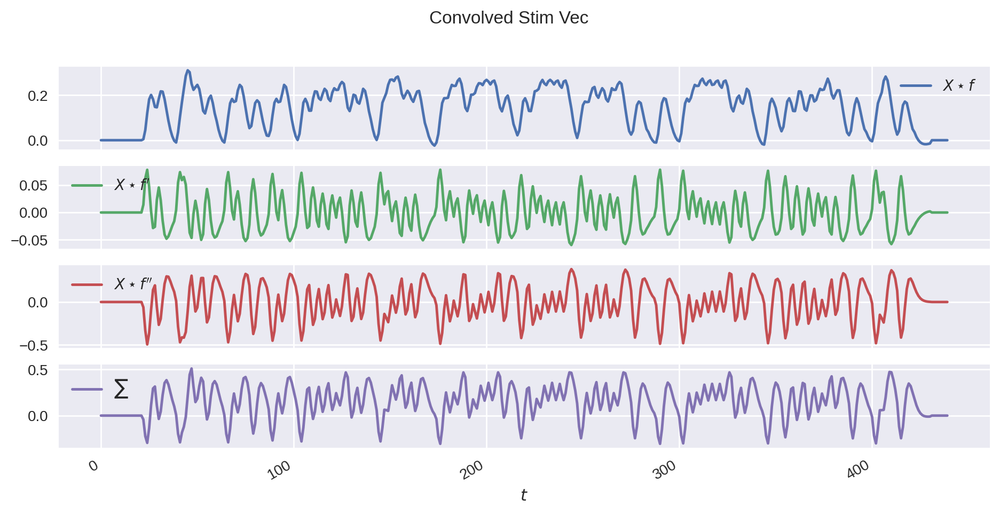

In [ ]:
predictor_stim_conv1 = np.convolve(predictor_stim, f, "full")[:440]
predictor_stim_conv2 = np.convolve(predictor_stim, f1, "full")[:440]
predictor_stim_conv3 = np.convolve(predictor_stim, f2, "full")[:440]



pd.DataFrame({r"$X \star f$" : predictor_stim_conv1,
              r"$X \star f'$" :predictor_stim_conv2,
              r"$X \star f''$":predictor_stim_conv3,
              r"$\sum$" : predictor_stim_conv1+predictor_stim_conv2+predictor_stim_conv3}).plot(subplots=True,
                                                                                                title="Convolved Stim Vec",
                                                                                                xlabel=r"$t$")

In this iteration of the linear model, the resulting design matrix includes 6 predictors: 1 intercept, 3 convolved predictors for the stimulus, and 2 predictors for the saccades and blinks.

In [ ]:
X = np.hstack((np.ones((tseries_filt_z.shape[0], 1)),
               predictor_stim_conv1[:, np.newaxis],
               predictor_stim_conv2[:, np.newaxis],
               predictor_stim_conv3[:, np.newaxis],
               predictor_sacc[:, np.newaxis], predictor_blink[:, np.newaxis]))
X.shape

(440, 6)

Like previously, we fit the linear model to the z-scored time series. We are also using masks for R-squared and V1, V2, and V3 to select the voxels that perform the best, but this time, we are using the threshold equal to the 11th highest R-squared value to select the 10 best voxels.

In [ ]:
betas = np.linalg.lstsq(X, tseries_filt_z, rcond=None)[0]
yhat = X@betas
rsq = 1-(yhat.T-tseries_filt_z.T).var(1)/tseries_filt_z.T.var(1)
yhat.shape, betas.shape,rsq.shape

((440, 118584), (6, 118584), (118584,))

In [ ]:
rsq_threshold = np.sort(rsq)[-11:][0] 
rsq_mask = rsq > rsq_threshold
V1_mask = atlas_data_both_hemis == roi_index_dict['V1']
V2_mask = atlas_data_both_hemis == roi_index_dict['V2']
V3_mask = atlas_data_both_hemis == roi_index_dict['V3']

responsive_V1_vertex_rsq = rsq[rsq_mask & V1_mask]
responsive_V2_vertex_rsq = rsq[rsq_mask & V2_mask]
responsive_V3_vertex_rsq = rsq[rsq_mask & V3_mask]
V1_indices = np.array([_ for _ in range(tseries_filt_z.shape[1]) if V1_mask[_]])
V2_indices = np.array([_ for _ in range(tseries_filt_z.shape[1]) if V2_mask[_]])
V3_indices = np.array([_ for _ in range(tseries_filt_z.shape[1]) if V3_mask[_]])
V1_indices_rsq = np.array([_ for _ in range(tseries_filt_z.shape[1]) if V1_mask[_] and rsq_mask[_]])
V2_indices_rsq = np.array([_ for _ in range(tseries_filt_z.shape[1]) if V2_mask[_] and rsq_mask[_]])
V3_indices_rsq = np.array([_ for _ in range(tseries_filt_z.shape[1]) if V3_mask[_] and rsq_mask[_]])


Here is an example of a voxel from the upper part of the threshold.

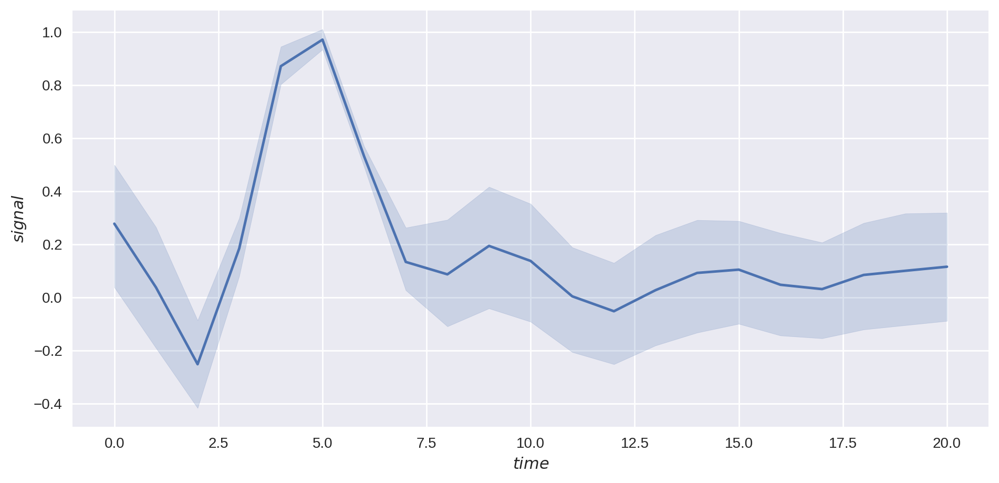

In [ ]:
example_voxel = pd.DataFrame(yhat.T[rsq_mask & V1_mask]).sample(1).T
tcs = [example_voxel.loc[s:s+n_t].reset_index(drop=True) for s in stim_TRs]
tcs = pd.DataFrame(np.array(tcs).reshape(63,21)).melt()

plt.ylabel(r"$signal$");plt.xlabel(r"$time$")
sns.lineplot(x="variable",y="value", data=tcs)


The plot of the 10 "best" voxels looks as follows:

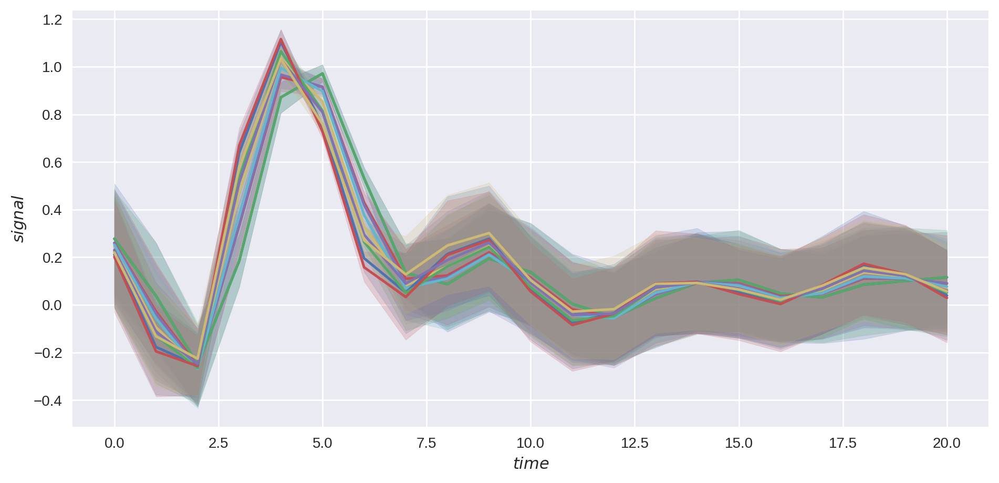

In [ ]:
example_voxels = pd.DataFrame(yhat.T[rsq_mask])
voxel = 0
example_voxel = pd.DataFrame(example_voxels.loc[voxel])
tcs = [example_voxel.loc[s:s+n_timepoints].reset_index(drop=True) for s in stim_TRs]
tcs = pd.DataFrame(np.array(tcs).reshape(63,n_timepoints+1)).melt()
ax = sns.lineplot(x="variable",y="value", data=tcs);#plt.legend(list(range(10)))
plt.ylabel(r"$signal$");plt.xlabel(r"$time$")
for voxel in example_voxels.T[1:]:
  example_voxel = pd.DataFrame(example_voxels.loc[voxel])
  tcs = [example_voxel.loc[s:s+n_timepoints].reset_index(drop=True) for s in stim_TRs]
  tcs = pd.DataFrame(np.array(tcs).reshape(63,n_timepoints+1)).melt()
  sns.lineplot(x="variable",y="value", data=tcs, ax=ax)


By plotting the best 10 voxels, we can notice a small offset between them. Both models show the peak at around 4.5 seconds.

We observe wide confidence intervals near the initial dips and the falloffs, but relatively narrow around the peaks. 

Even though the FIR model is giving weaker shape assumptions, lower precision due to the high number of parameters and noisy estimates, there will be less systematic bias.
On the other hand, our HRF basis set model make stronger assumptions about shape, therefore being more biased. But this model has a greatly reduced amount of degrees of freedom, thus giving a higher precision and reliability of the estimates.

For the sake of simplicity, we would consider the temporal HRF model over the FIR model.

In [ ]:
print(yhat.T[rsq_mask & V1_mask].shape)
print(yhat.T[rsq_mask & V2_mask].shape)
print(yhat.T[rsq_mask & V3_mask].shape)


(10, 1320)
(0, 1320)
(0, 1320)


It can also be visually observed that all the best 10 voxels have a similar response timecourse to the FIR model result. Interestingly, all of them come from the V1 region.

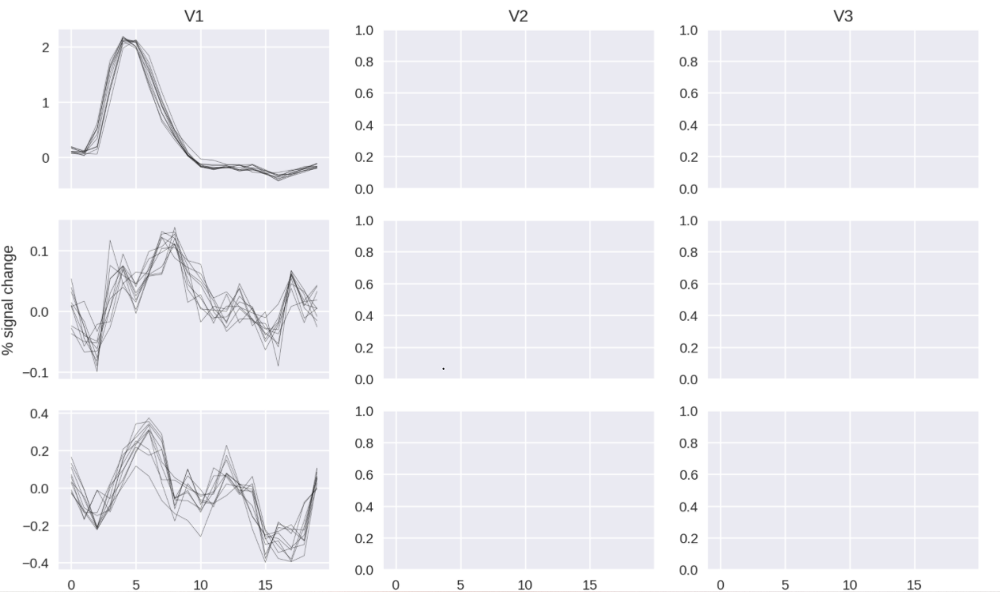

Now, we are changing the upsample fold from 1 to 3, to get a smoother shape of the temporal functions.

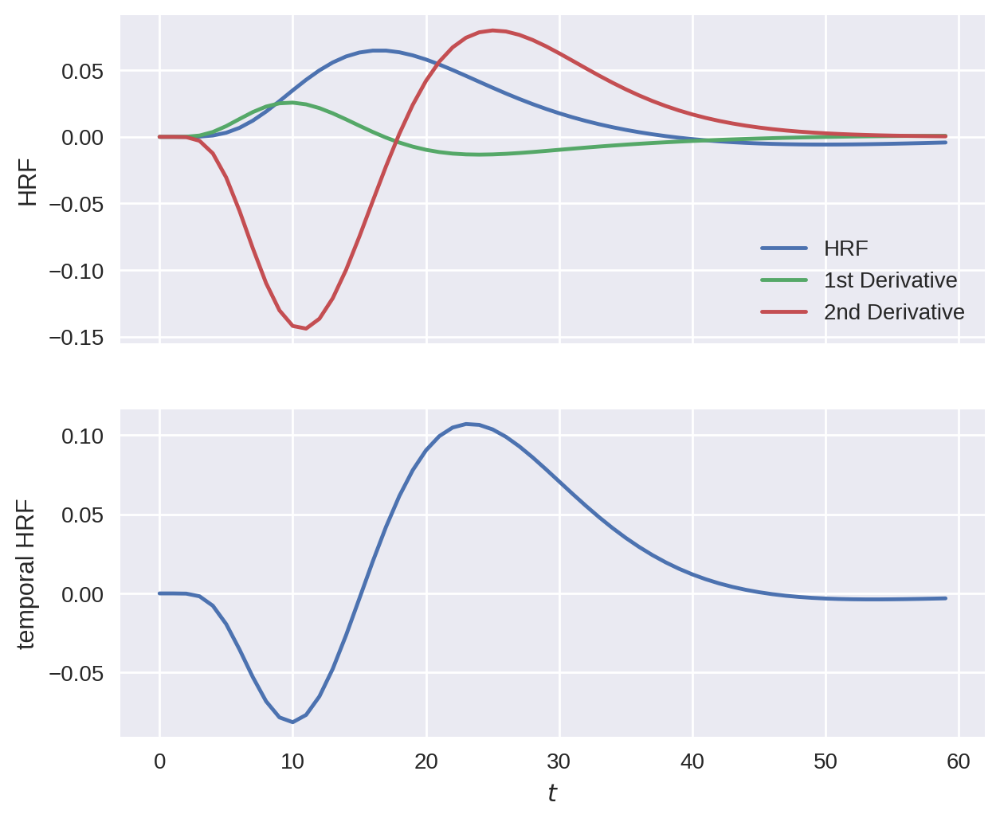

In [ ]:
upsample_fold = 3 #i.e 1 for None
n_t = 20
lag = 0
f = spm_hrf(tr=.945,oversampling=upsample_fold,time_length=n_t-1, onset=lag)
f1 = spm_time_derivative(tr=.945,oversampling=upsample_fold,time_length=n_t-1, onset=lag)
f2 = spm_dispersion_derivative(tr=.945,oversampling=upsample_fold,time_length=n_t-1, onset=lag)

fig, axes = plt.subplots(2,1,sharex=True,figsize=(7,6))
pd.Series(f).plot(ax=axes[0])
pd.Series(f1).plot(ax=axes[0])
pd.Series(f2).plot(ax=axes[0])
pd.Series(f+f1+f2).plot(ax=axes[1])
axes[0].legend(["HRF","1st Derivative", "2nd Derivative"])
axes[0].set_ylabel("HRF"); 
axes[1].set_ylabel("temporal HRF"); 
axes[1].set_xlabel(r"$t$");

We have to rescale the time series and the other relevant variables because we have changed the upsample fold value.

In [ ]:
tr = .945 / upsample_fold
n_timepoints=n_t*upsample_fold

from scipy.signal import resample
tseries_filt_z_upsampled = resample(tseries_filt_z, 440 * upsample_fold, axis=0)

blink_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_blink-times.tsv'), delimiter='\t')
sacc_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_sacc-times.tsv'), delimiter='\t')
stim_times = np.loadtxt(os.path.join('/content/data/hrf_mapper_59k/', 'sub-012_ses-2_task-hrfmapper_run-1_stim-times.tsv'), delimiter='\t')


stim_TRs = np.floor(stim_times/tr).astype(int)
sacc_TRs = np.floor(sacc_times/tr).astype(int)
blink_TRs = np.floor(blink_times/tr).astype(int)

# make sure no responses we try to fit run over the duration of our data
# this happens for the saccade times

stim_TRs = stim_TRs[stim_TRs < (tseries_raw.shape[1]*upsample_fold - n_timepoints)]
sacc_TRs = sacc_TRs[sacc_TRs < (tseries_raw.shape[1]*upsample_fold - n_timepoints)]
blink_TRs = blink_TRs[blink_TRs < (tseries_raw.shape[1]*upsample_fold - n_timepoints)]


predictor_stim = np.array([1 if _ in stim_TRs else 0 for _ in range(440*upsample_fold)])
predictor_sacc = np.array([1 if _ in sacc_TRs else 0 for _ in range(440*upsample_fold)])
predictor_blink = np.array([1 if _ in blink_TRs else 0 for _ in range(440*upsample_fold)])

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f01d49dc3d0>,
      dtype=object)

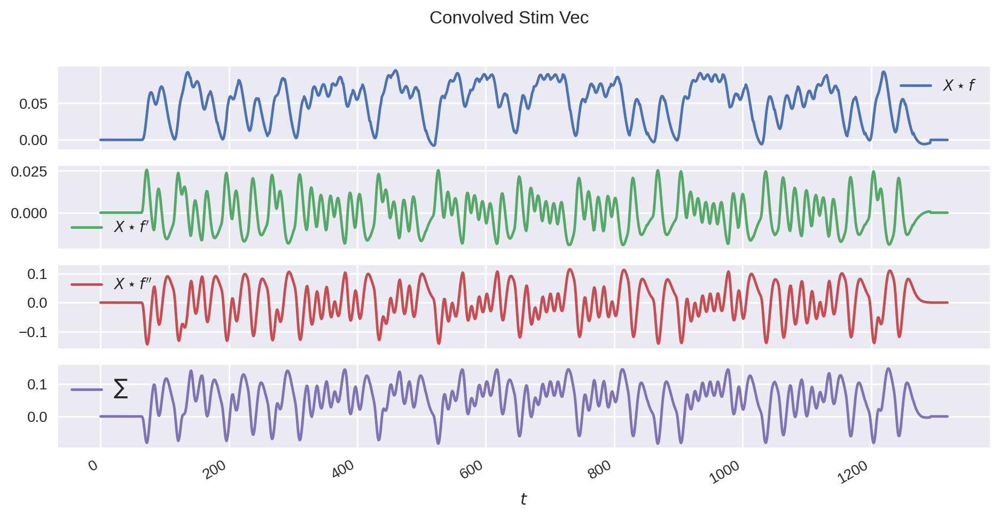

In [ ]:
predictor_stim_conv1 = np.convolve(predictor_stim, f, "full")[:440*upsample_fold]
predictor_stim_conv2 = np.convolve(predictor_stim, f1, "full")[:440*upsample_fold]
predictor_stim_conv3 = np.convolve(predictor_stim, f2, "full")[:440*upsample_fold]



pd.DataFrame({r"$X \star f$" : predictor_stim_conv1,
              r"$X \star f'$" :predictor_stim_conv2,
              r"$X \star f''$":predictor_stim_conv3,
              r"$\sum$" : predictor_stim_conv1+predictor_stim_conv2+predictor_stim_conv3}).plot(subplots=True,
                                                                                                title="Convolved Stim Vec",
                                                                                                xlabel=r"$t$")

We recreate the design matrix using the new scaled predictors and refit the GLM model and recalculate the results.

In [ ]:
X = np.hstack((np.ones((tseries_filt_z_upsampled.shape[0], 1)),
               predictor_stim_conv1[:, np.newaxis],
               predictor_stim_conv2[:, np.newaxis],
               predictor_stim_conv3[:, np.newaxis],
               predictor_sacc[:, np.newaxis], predictor_blink[:, np.newaxis]))
X.shape

(1320, 6)

In [ ]:
betas = np.linalg.lstsq(X, tseries_filt_z_upsampled, rcond=None)[0]
yhat = X@betas
rsq = 1-(yhat.T-tseries_filt_z_upsampled.T).var(1)/tseries_filt_z_upsampled.T.var(1)
yhat.shape, betas.shape,rsq.shape

((1320, 118584), (6, 118584), (118584,))

In [ ]:
rsq_threshold = np.sort(rsq)[-11:][0] 
rsq_mask = rsq > rsq_threshold
V1_mask = atlas_data_both_hemis == roi_index_dict['V1']
V2_mask = atlas_data_both_hemis == roi_index_dict['V2']
V3_mask = atlas_data_both_hemis == roi_index_dict['V3']
responsive_V1_vertex_rsq = rsq[rsq_mask & V1_mask]
responsive_V2_vertex_rsq = rsq[rsq_mask & V2_mask]
responsive_V3_vertex_rsq = rsq[rsq_mask & V3_mask]
top10_indices = np.array([_ for _ in range(tseries_filt_z.shape[1]) if rsq_mask[_]])
V1_indices = np.array([_ for _ in range(tseries_filt_z.shape[1]) if V1_mask[_]])
V2_indices = np.array([_ for _ in range(tseries_filt_z.shape[1]) if V2_mask[_]])
V3_indices = np.array([_ for _ in range(tseries_filt_z.shape[1]) if V3_mask[_]])
V1_indices_rsq = np.array([_ for _ in range(tseries_filt_z.shape[1]) if V1_mask[_] and rsq_mask[_]])
V2_indices_rsq = np.array([_ for _ in range(tseries_filt_z.shape[1]) if V2_mask[_] and rsq_mask[_]])
V3_indices_rsq = np.array([_ for _ in range(tseries_filt_z.shape[1]) if V3_mask[_] and rsq_mask[_]])


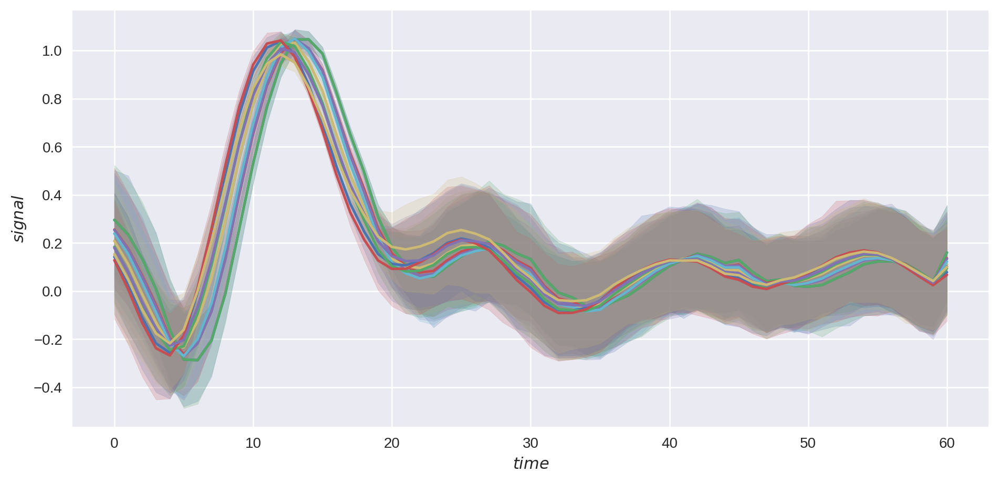

In [ ]:
example_voxels = pd.DataFrame(yhat.T[rsq_mask])
voxel = 0
example_voxel = pd.DataFrame(example_voxels.loc[voxel])
tcs = [example_voxel.loc[s:s+n_timepoints].reset_index(drop=True) for s in stim_TRs]
tcs = pd.DataFrame(np.array(tcs).reshape(63,n_timepoints+1)).melt()
ax = sns.lineplot(x="variable",y="value", data=tcs);#plt.legend(list(range(10)))
plt.ylabel(r"$signal$");plt.xlabel(r"$time$")
for voxel in example_voxels.T[1:]:
  example_voxel = pd.DataFrame(example_voxels.loc[voxel])
  tcs = [example_voxel.loc[s:s+n_timepoints].reset_index(drop=True) for s in stim_TRs]
  tcs = pd.DataFrame(np.array(tcs).reshape(63,n_timepoints+1)).melt()
  sns.lineplot(x="variable",y="value", data=tcs, ax=ax)


We get a much more smoother shape if we upsample the data.

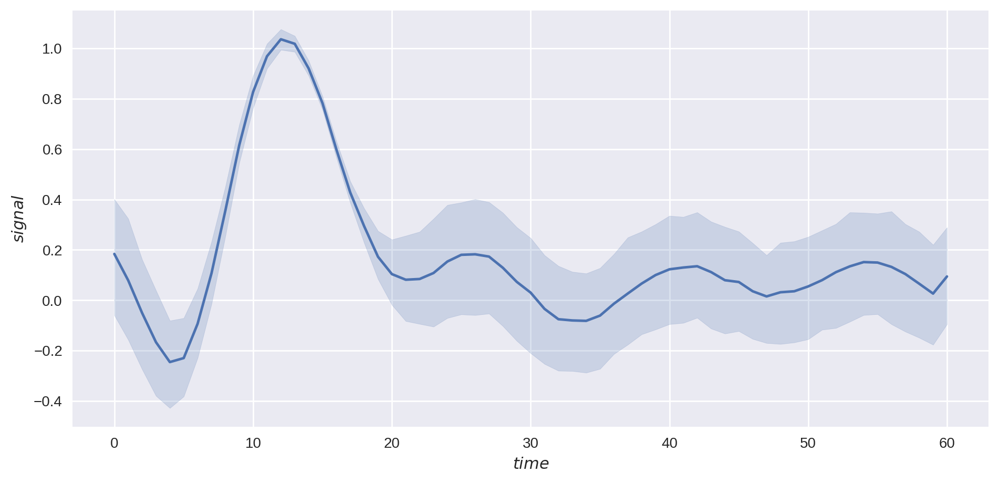

In [ ]:
example_voxel = pd.DataFrame(yhat.T[rsq_mask]).sample(1).T
tcs = [example_voxel.loc[s:s+n_timepoints].reset_index(drop=True) for s in stim_TRs]
tcs = pd.DataFrame(np.array(tcs).reshape(63,n_timepoints+1)).melt()
plt.ylabel(r"$signal$");plt.xlabel(r"$time$")
sns.lineplot(x="variable",y="value", data=tcs)

As noted before, there is a large degree of similarity to the smoothed FIR results. Of particular notice is the prominent initial dip in signal strength, in and of itself difficult to observe, and in the case of the FIR models barely noticeable in the V1 data. Another fact worthy of notice is that our three-function approach did not require any usage of nuisance regressors provided with the fMRI data to achieve very similar results.

In the interest of inspecting the impact of each of the three basis functions, we create a boxplot of the betas calcuated for their timecourses.

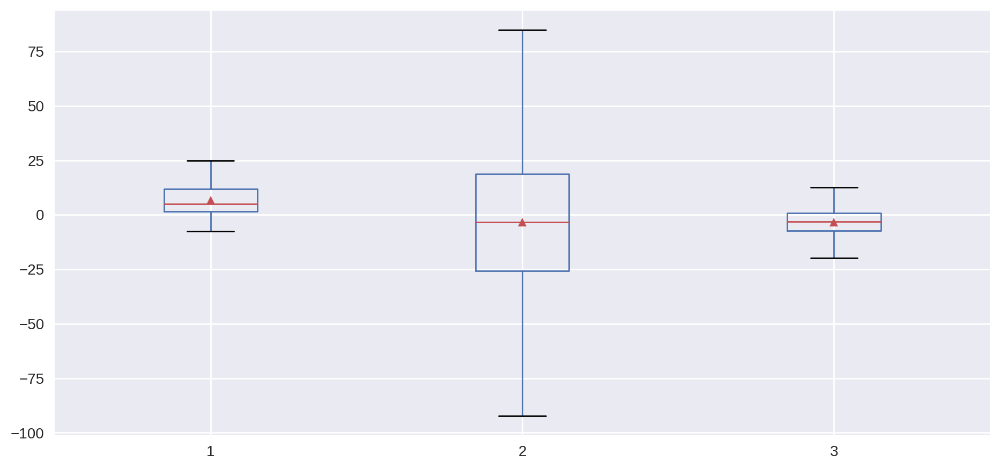

In [ ]:
pd.DataFrame(betas.T[V1_mask])[[1,2,3]].boxplot(showfliers=False, showmeans=True)

The variance in component 2 (temporal derivative) betas is multiple times bigger than in component 1 (shape) or component 3 (width). This signals that while the modeled HRF responses have very similar shapes, their offsets differ significantly from one another. It confirms our earlier visual inspection results, namely that the timecourses of BOLD responses don't always occur within the idealized timeframes, but instead can suffer from delay.

#Discussion

In our analysis we aimed to explore different strategies for modeling the hemodynamic response functions. The end goal of this was to ensure that the models of blood oxygen level-dependent activity match up with the observable reality, as well as to find out how the data we have corresponds with other known research on this subject.

We found that while the shape of the response indeed matches up to a large degree with the theorized one, there is also a significant discrepancy, especially in peak timings, between voxels within the same subject. This is in agreement with existing research, as the problem of difference in BOLD shapes was noted as early as in 1995 by Lee et al. (1995).

In writing on the topic of delayed BOLD responses, Kay et al. note that "For any given voxel (or vertex), the BOLD response to an experimental event is expected to reflect a mixture of early (microvasculature) and late (macrovasculature) timecourses. The specific proportion of these timecourses is expected to vary from voxel to voxel simply due to heterogeneity in the spatial structure of the vasculature (for example, one voxel might be centered on a large vein, whereas another voxel may only partially overlap the vein)." Here we provide a direct visual and numerica confirmation of said phenomenon. We also confirm that a temporal basis set of the SPM HRF, it's first and second derivatives, can capture these effects using up only 6 degrees of freedom just as well (if not better) then an FIR design which takes away 181 degrees. This is particularly interesting considering we didn't need to use nuisance regressors from the provided dataset.

While our aim was not to produce models for future predictions, the comparative performance of a basis set model leads us to recommend it over an FIR model, especially if BOLD responses were to be predicted.

#Summary

By investigating the timecourses of responses to visual stimuli in fMRI experimental data we have confirmed the variability of the actual BOLD shapes, in comparison to the idealized HRF. We were capable of detecting the difference in offsets of responses, attributable to differences in vasculature in the brain, as well as to compare different linear models for extracting the shapes from data. Our analysis is in agreement with the existing body of work on the subject, and points out the tradeoffs between different linear models which can be used.

#References

1. Kay, K., Jamison, K.W., Zhang, RY. et al. A temporal decomposition method for identifying venous effects in task-based fMRI. Nat Methods 17, 1033–1039 (2020). https://doi.org/10.1038/s41592-020-0941-6

2. Lee, A. T., Glover, G. H. & Meyer, C. H. Discrimination of large venous vessels in time-course spiral blood-oxygen-level-dependent magnetic-resonance functional neuroimaging. Magn.  Reson.  Med.33, 745–754 (1995).